In [1]:
# on-policy first-visit MC prediction, on-policy every-visit MC prediction, TD, n-step TD, TD(λ)

In [2]:
import warnings ; warnings.filterwarnings('ignore')

import gymnasium as gym, gym_walk, gym_aima
import numpy as np
from pprint import pprint
from tqdm import tqdm_notebook as tqdm

from itertools import cycle, count

import random
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.pylab as pylab
SEEDS = (12, 34, 56, 78, 90)

%matplotlib inline

In [3]:
plt.style.use('fivethirtyeight')
params = {
    'figure.figsize': (15, 8),
    'font.size': 24,
    'legend.fontsize': 20,
    'axes.titlesize': 28,
    'axes.labelsize': 24,
    'xtick.labelsize': 20,
    'ytick.labelsize': 20
}
pylab.rcParams.update(params)
np.set_printoptions(suppress=True)

In [4]:
def policy_evaluation(pi, P, gamma=1.0, theta=1e-10):
    prev_V = np.zeros(len(P), dtype=np.float64)
    while True:
        V = np.zeros(len(P), dtype=np.float64)
        for s in range(len(P)):
            for prob, next_state, reward, done in P[s][pi(s)]:
                V[s] += prob * (reward + gamma * prev_V[next_state] * (not done))
        if np.max(np.abs(prev_V - V)) < theta:
            break
        prev_V = V.copy()
    return V

In [5]:
def print_policy(pi, P, action_symbols=('<', 'v', '>', '^'), n_cols=4, title='Policy:'):
    print(title)
    arrs = {k:v for k,v in enumerate(action_symbols)}
    for s in range(len(P)):
        a = pi(s)
        print("| ", end="")
        if np.all([done for action in P[s].values() for _, _, _, done in action]):
            print("".rjust(9), end=" ")
        else:
            print(str(s).zfill(2), arrs[a].rjust(6), end=" ")
        if (s + 1) % n_cols == 0: print("|")

In [6]:
def print_state_value_function(V, P, n_cols=4, prec=3, title='State-value function:'):
    print(title)
    for s in range(len(P)):
        v = V[s]
        print("| ", end="")
        if np.all([done for action in P[s].values() for _, _, _, done in action]):
            print("".rjust(9), end=" ")
        else:
            print(str(s).zfill(2), '{}'.format(np.round(v, prec)).rjust(6), end=" ")
        if (s + 1) % n_cols == 0: print("|")

In [7]:
def print_action_value_function(Q, 
                                optimal_Q=None, 
                                action_symbols=('<', '>'), 
                                prec=3, 
                                title='Action-value function:'):
    vf_types=('',) if optimal_Q is None else ('', '*', 'er')
    headers = ['s',] + [' '.join(i) for i in list(itertools.product(vf_types, action_symbols))]
    print(title)
    states = np.arange(len(Q))[..., np.newaxis]
    arr = np.hstack((states, np.round(Q, prec)))
    if not (optimal_Q is None):
        arr = np.hstack((arr, np.round(optimal_Q, prec), np.round(optimal_Q-Q, prec)))
    print(tabulate(arr, headers, tablefmt="fancy_grid"))

In [8]:
def probability_success(env, pi, goal_state, n_episodes=100, max_steps=200):
    random.seed(123); np.random.seed(123) ; env.reset(seed=123)
    results = []
    for _ in range(n_episodes):
        state, _ = env.reset()
        done, steps = False, 0
        while not done and steps < max_steps:
            state, _, terminated, truncated, h = env.step(pi(state))
            done = terminated or truncated
            steps += 1
        results.append(state == goal_state)
    return np.sum(results)/len(results)*100

In [9]:
def mean_return(env, gamma, pi, n_episodes=100, max_steps=200):
    random.seed(123); np.random.seed(123) ; env.reset(seed=123)
    results = []
    for _ in range(n_episodes):
        state, _ = env.reset()
        done, steps = False, 0
        results.append(0.0)
        while not done and steps < max_steps:
            state, reward, terminated, truncated, _ = env.step(pi(state))
            done = terminated or truncated
            results[-1] += (gamma**steps * reward)
            steps += 1
    return np.mean(results)

In [10]:
def rmse(x, y, dp=4):
    return np.round(np.sqrt(np.mean((x - y)**2)), dp)

In [11]:
def plot_value_function(title : str, 
                        V_track: np.array, 
                        V_true: np.array=None, 
                        log: bool=False, 
                        limit_value: float=0.05, 
                        limit_items: int=5):
    """
    Plots the value function estimates over time.
    
    This function randomly selects up to `limit_items` states whose final
    estimated value exceeds `limit_value`. It then plots the estimated value
    function over episodes for these states. If the true value function `V_true`
    is provided, it also plots horizontal lines representing the true values
    for comparison.
    
    Arguments:
        title: str
            Title of the plot.
        V_track: np.array
            2D array where each column corresponds to the estimated value function
            of a state over episodes.
        V_true: np.array, optional
            True value function for comparison. If provided, horizontal lines
            will be drawn at these values.
        log: bool, optional
            If True, the x-axis will be on a logarithmic scale. Defaults to False.
        limit_value: float, optional
            Minimum final estimated value for a state to be considered for plotting. Defaults to 0.05.
        limit_items: int, optional
            Maximum number of states to plot. Defaults to 5.
    
    Returns:
        None
    """
    np.random.seed(123)
    per_col = 25
    linecycler = cycle(["-","--",":","-."])
    legends = []

    valid_values = np.argwhere(V_track[-1] > limit_value).squeeze()
    items_idxs = np.random.choice(valid_values, 
                                  min(len(valid_values), limit_items), 
                                  replace=False)
    # draw the true values first
    if V_true is not None:
        for i, state in enumerate(V_track.T):
            if i not in items_idxs:
                continue
            if state[-1] < limit_value:
                continue

            label = 'v({})'.format(i)
            plt.axhline(y=V_true[i], color='k', linestyle='-', linewidth=1)
            plt.text(int(len(V_track)*1.02), V_true[i]+.01, label)

    # then the estimates
    for i, state in enumerate(V_track.T):
        if i not in items_idxs:
            continue
        if state[-1] < limit_value:
            continue
        line_type = next(linecycler)
        label = 'V({})'.format(i)
        p, = plt.plot(state, line_type, label=label, linewidth=3)
        legends.append(p)
        
    legends.reverse()

    ls = []
    for loc, idx in enumerate(range(0, len(legends), per_col)):
        subset = legends[idx:idx+per_col]
        l = plt.legend(subset, [p.get_label() for p in subset], 
                       loc='center right', bbox_to_anchor=(1.25, 0.5))
        ls.append(l)
    [plt.gca().add_artist(l) for l in ls[:-1]]
    if log: plt.xscale('log')
    plt.title(title)
    plt.ylabel('State-value function')
    plt.xlabel('Episodes (log scale)' if log else 'Episodes')
    plt.show()

In [48]:
def plot_targets(targets : dict, init_state : int, title: str):
    """
    Plots the sequence of target values for a specific state.
    Think of the sequence as the number of times the state was visited during training.
    
    Arguments:
        targets: dict
            Dictionary mapping states to lists of target values observed during training.
        init_state: int
            The state for which to plot the target values.
        title: str
            Title of the plot.
    
    Returns:
        None
    """
    x = range(len(targets[init_state]))
    y = targets[init_state]
    
    label = 'v({})'.format(init_state)
    plt.axhline(y=V_true[init_state], color='k', linestyle='-', linewidth=1)
    plt.text(int(x[-1]*1.02), V_true[init_state]+.01, label)

    plt.scatter(x, y, 
                c=np.array(targets[init_state]),
                cmap=plt.get_cmap('viridis'),
                alpha=0.4)
    plt.title(title)

    plt.ylabel('Target value')
    plt.xlabel('Estimate sequence number')
    plt.show()

In [13]:
def decay_schedule(init_value, min_value, decay_ratio, max_steps, log_start=-2, log_base=10):
    decay_steps = int(max_steps * decay_ratio)
    rem_steps = max_steps - decay_steps
    values = np.logspace(log_start, 0, decay_steps, base=log_base, endpoint=True)[::-1]
    values = (values - values.min()) / (values.max() - values.min())
    values = (init_value - min_value) * values + min_value
    values = np.pad(values, (0, rem_steps), 'edge')
    return values

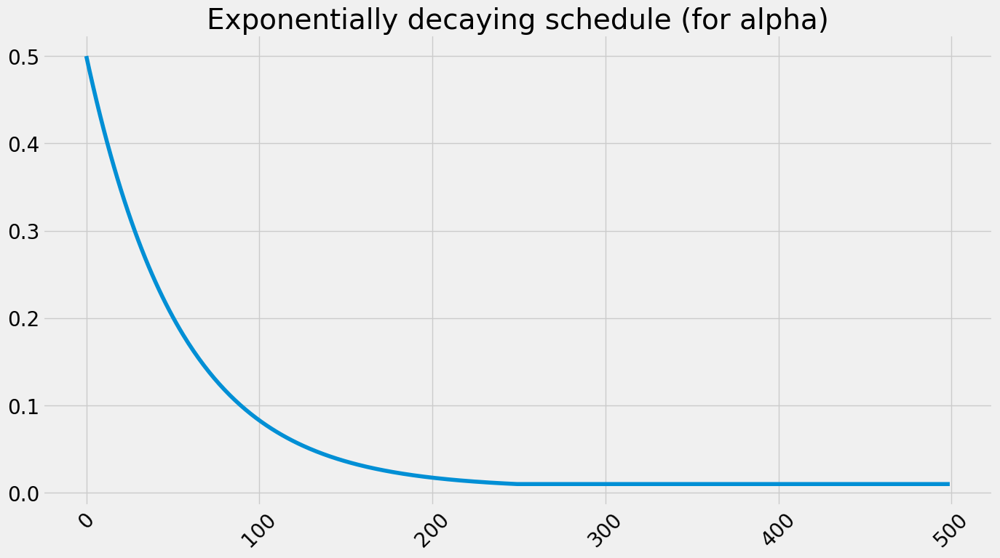

In [14]:
plt.plot(decay_schedule(0.5, 0.01, 0.5, 500))
plt.title('Exponentially decaying schedule (for alpha)')
plt.xticks(rotation=45)
plt.show()

# Random walk/Deterministic walk with uniformly random policy

In [15]:
env = gym.make('RandomWalk-v0')
init_state, _ = env.reset()
goal_state = 6
gamma = 1.0
n_episodes = 500
P = env.unwrapped.P

LEFT, RIGHT = range(2)
pi = lambda s: {
    0:LEFT, 1:LEFT, 2:LEFT, 3:LEFT, 4:LEFT, 5:LEFT, 6:LEFT
}[s]
V_true = policy_evaluation(pi, P, gamma=gamma)

print_state_value_function(V_true, P, n_cols=7)
print()
print_policy(pi, P, action_symbols=('<', '>'), n_cols=7)
print('Reaches goal {:.2f}%. Obtains an average return of {:.4f}.'.format(
    probability_success(env, pi, goal_state=goal_state), 
    mean_return(env, gamma, pi)))

State-value function:
| 00  0.083 | 01  0.167 | 02  0.333 | 03    0.5 | 04  0.667 | 05  0.833 | 06  0.417 |

Policy:
| 00      < | 01      < | 02      < | 03      < | 04      < | 05      < | 06      < |
Reaches goal 48.00%. Obtains an average return of 0.4800.


# First-visit Monte-Carlo prediction

In [16]:
def generate_trajectory(pi : callable, 
                        env : gym.Env, 
                        max_steps : int =200):
    """
    Generates a trajectory by following policy pi in environment env.
    The trajectory is a list of experiences (state, action, reward, next_state, done).
    The trajectory ends when a terminal state is reached or when max_steps is reached.
    
    Parameters:
    pi: function
        The policy to follow, mapping states to actions.
    env: gym environment
        The environment in which to generate the trajectory.
    max_steps: int
        The maximum number of steps to take in the trajectory.
        
    Returns:
    np.array
        An array of experiences forming the trajectory.
    """
    done, trajectory = False, []
    while not done:
        state, _ = env.reset()
        for t in count():
            action = pi(state) 
            next_state, reward, terminated, truncated, _ = env.step(action)
            done = terminated or truncated
            experience = (state, action, reward, next_state, done)
            trajectory.append(experience)
            if done:
                break
            # discard incomplete episode
            if t >= max_steps - 1:
                trajectory = [] 
                break
            state = next_state
    return np.array(trajectory, object)

In [ ]:
def mc_prediction(pi : callable, 
                  env : gym.Env, 
                  gamma : float =1.0,
                  init_alpha : float =0.5,
                  min_alpha : float =0.01,
                  alpha_decay_ratio : float =0.5,
                  n_episodes : int =500, 
                  max_steps : int =200,
                  first_visit : bool =True):
    """
    On-policy Monte Carlo prediction algorithm to estimate the state-value function V under policy pi.
    
    Parameters:
    pi: function
        The policy to evaluate, mapping states to actions.
    env: gym environment
        The environment in which to evaluate the policy.
    gamma: float
        Discount factor.
    init_alpha: float
        Initial learning rate.
    min_alpha: float
        Minimum learning rate.
    alpha_decay_ratio: float
        Ratio of episodes over which to decay the learning rate.
    n_episodes: int
        Number of episodes to sample.
    max_steps: int
        Maximum number of steps per episode.
    first_visit: bool
        If True, use first-visit MC (update only on the first visit to a state in an episode); 
        if False, use every-visit MC (update on every visit).
    
    Returns:
    V: np.array
        Estimated state-value function.
    V_track: np.array
        Tracking of V over episodes.
    targets: dict
        Dictionary mapping states to lists of target returns G observed during training.
    """
    nS = env.observation_space.n
    # precompute discounts
    discounts = np.logspace(0, 
                            max_steps, 
                            num=max_steps, 
                            base=gamma, 
                            endpoint=False)
    # precompute decaying alphas
    alphas = decay_schedule(init_alpha, 
                            min_alpha, 
                            alpha_decay_ratio, 
                            n_episodes)
    # we start with zero value function
    V = np.zeros(nS, dtype=np.float64)
    V_track = np.zeros((n_episodes, nS), dtype=np.float64)
    targets = {state:[] for state in range(nS)}

    for e in tqdm(range(n_episodes), leave=False):
        # Given pi, generate a trajectory until termination
        # This is the "Sampling" step where we interact with the environment
        trajectory = generate_trajectory(pi, 
                                         env, 
                                         max_steps)
        # After this, we have the full trajectory stored in memory
        # we then estimate V using our knowledge of the returns G
        # This is the "Estimation" step

        visited = np.zeros(nS, dtype=np.bool)
        for t, (state, _, reward, _, _) in enumerate(trajectory):
            # Then walk through each time step in the trajectory...
            if visited[state] and first_visit:
                # We only continue the code if it's the first visit MC
                # Otherwise, we skip to the next time step
                continue
            visited[state] = True
            
            n_steps = len(trajectory[t:])
            
            # Retrospectively compute returns G (discounted sum of rewards)
            # The key insight here is that we were only able to compute G
            # since in the past we have stored all rewards from time t until the end of episode
            # so this is an offline method
            G = np.sum(discounts[:n_steps] * trajectory[t:, 2])
            
            # This becomes the target for state-value function
            targets[state].append(G)
            # As an analogy, this kinda resembles supervised learning targets 
            # G is what we actually got from interacting with the environment
            # and V[state] is our current estimate
            mc_error = G - V[state]
            # If error is positive, we increase V[state] (so V catches up to G)
            # If error is negative, we decrease V[state]
            V[state] = V[state] + alphas[e] * mc_error
        V_track[e] = V
    return V.copy(), V_track, targets

In [18]:
# Here we just run MC using multiple seeds to average results

V_fvmcs, V_track_fvmcs = [], []
for seed in tqdm(SEEDS, desc='All seeds', leave=True):
    random.seed(seed); np.random.seed(seed) ; env.reset(seed=seed)
    V_fvmc, V_track_fvmc, targets_fvmc = mc_prediction(pi, env, gamma=gamma, n_episodes=n_episodes)
    V_fvmcs.append(V_fvmc) ; V_track_fvmcs.append(V_track_fvmc)
V_fvmc, V_track_fvmc = np.mean(V_fvmcs, axis=0), np.mean(V_track_fvmcs, axis=0)
del V_fvmcs ; del V_track_fvmcs

All seeds:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

In [19]:
# V_true is the true value function computed via policy evaluation (with access to P)
# V_fvmc is the estimated value function via first-visit MC (no access to P)

print_state_value_function(V_fvmc, P, n_cols=7)
print()
print_state_value_function(V_fvmc - V_true, P, n_cols=7, title='State-value function errors:')
print('RMSE:', rmse(V_fvmc, V_true))

State-value function:
| 00    0.0 | 01   0.17 | 02  0.343 | 03  0.509 | 04   0.67 | 05  0.843 | 06    0.0 |

State-value function errors:
| 00 -0.083 | 01  0.003 | 02  0.009 | 03  0.009 | 04  0.003 | 05   0.01 | 06 -0.417 |
RMSE: 0.1607


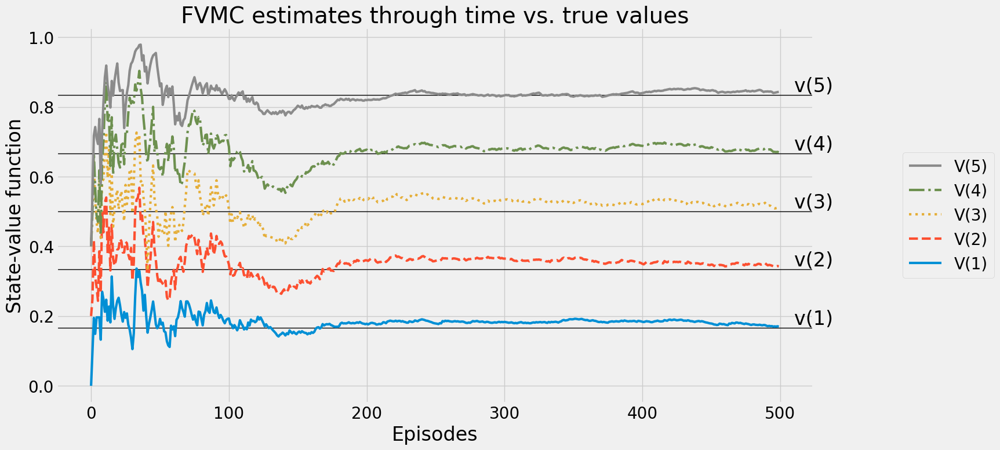

In [20]:
# Plots states 0, 4, 6, 9, 10
plot_value_function('FVMC estimates through time vs. true values', V_track_fvmc, V_true, log=False)

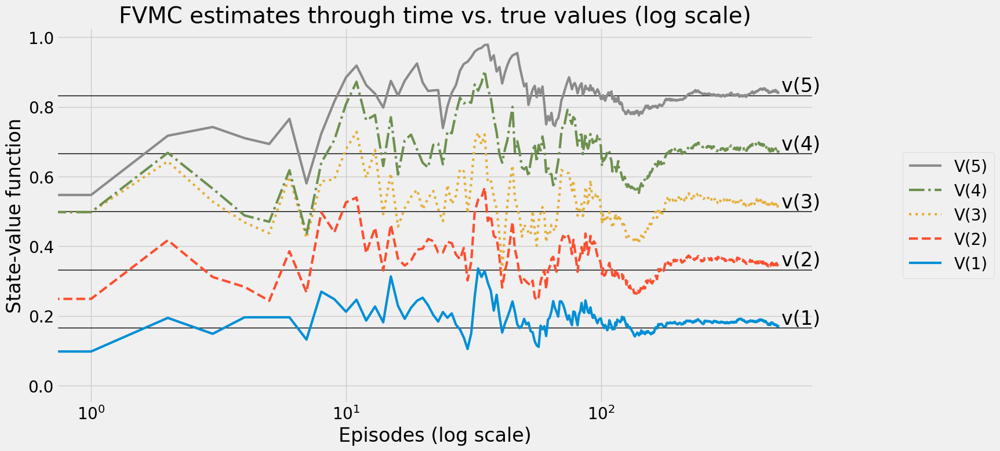

In [21]:
plot_value_function('FVMC estimates through time vs. true values (log scale)', V_track_fvmc, V_true, log=True)

# Every-visit Monte-Carlo prediction

In [22]:
V_evmcs, V_track_evmcs = [], []
for seed in tqdm(SEEDS, desc='All seeds', leave=True):
    random.seed(seed); np.random.seed(seed) ; env.reset(seed=seed)
    V_evmc, V_track_evmc, targets_evmc = mc_prediction(pi, env, gamma=gamma, n_episodes=n_episodes, first_visit=False)
    V_evmcs.append(V_evmc) ; V_track_evmcs.append(V_track_evmc)
V_evmc, V_track_evmc = np.mean(V_evmcs, axis=0), np.mean(V_track_evmcs, axis=0)
del V_evmcs ; del V_track_evmcs

All seeds:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

In [23]:
print_state_value_function(V_evmc, P, n_cols=7)
print()
print_state_value_function(V_evmc - V_true, P, n_cols=7, title='State-value function errors:')
print('RMSE:', rmse(V_evmc, V_true))

State-value function:
| 00    0.0 | 01  0.156 | 02  0.326 | 03  0.492 | 04  0.661 | 05  0.841 | 06    0.0 |

State-value function errors:
| 00 -0.083 | 01  -0.01 | 02 -0.007 | 03 -0.008 | 04 -0.005 | 05  0.008 | 06 -0.417 |
RMSE: 0.1607


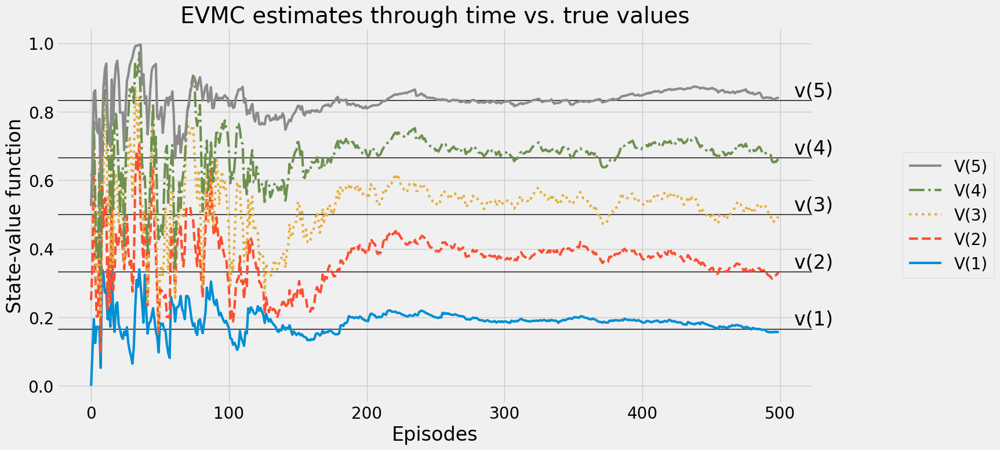

In [24]:
plot_value_function('EVMC estimates through time vs. true values', V_track_evmc, V_true, log=False)

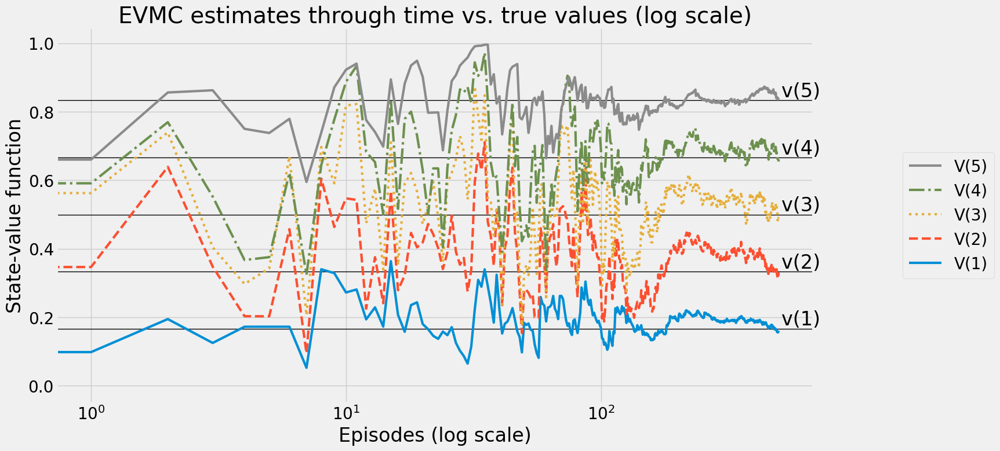

In [25]:
plot_value_function('EVMC estimates through time vs. true values (log scale)', V_track_evmc, V_true, log=True)

The plot above shows that both methods converged closely to the true value function, but every-visit MC has higher variance than first-visit MC.
This is expected, as every-visit MC uses more data (all visits) but the returns from multiple visits to the same state within an episode are correlated, leading to higher variance in the estimates.

# Temporal-Difference Prediction (TD)

In [ ]:
def td(pi: callable, 
    env: gym.Env, 
    gamma: float = 1.0,
    init_alpha: float = 0.5,
    min_alpha: float = 0.01,
    alpha_decay_ratio: float = 0.5,
    n_episodes: int = 500) -> tuple[np.ndarray, np.ndarray, dict]:
    """
    Temporal-Difference (TD) prediction algorithm to estimate the state-value function V under policy pi.
    
    Parameters:
        pi: callable
            The policy to evaluate, mapping states to actions.
        env: gym.Env
            The environment in which to evaluate the policy.
        gamma: float
            Discount factor.
        init_alpha: float
            Initial learning rate.
        min_alpha: float
            Minimum learning rate.
        alpha_decay_ratio: float
            Ratio of episodes over which to decay the learning rate.
        n_episodes: int
            Number of episodes to sample.
    
    Returns:
        V: np.ndarray
            Estimated state-value function.
        V_track: np.ndarray
            Tracking of V over episodes.
        targets: dict
            Dictionary mapping states to lists of TD targets observed during training.
    """
    nS = env.observation_space.n
    V = np.zeros(nS, dtype=np.float64)
    V_track = np.zeros((n_episodes, nS), dtype=np.float64)
    targets = {state: [] for state in range(nS)}
    
    # precompute decaying alphas
    alphas = decay_schedule(
        init_alpha, min_alpha,
        alpha_decay_ratio, n_episodes)
    
    # Notice here we need not to store full trajectories
    # as TD is an online method
    for e in tqdm(range(n_episodes), leave=False):
        state, _ = env.reset()
        done = False
        while not done:
            action = pi(state)
            next_state, reward, terminated, truncated, _ = env.step(action)
            done = terminated or truncated
            # This is the TD target or estimated return
            # Since it is dependent on V[next_state] we don't need full trajectory
            td_target = reward + gamma * V[next_state] * (not done)
            targets[state].append(td_target)
            # Compute the error between target and current estimate
            td_error = td_target - V[state]
            # Update V[state] towards the TD target similar to MC (or any other supervised learning algorithms)
            V[state] = V[state] + alphas[e] * td_error
            state = next_state
        V_track[e] = V
    return V, V_track, targets

In [27]:
V_tds, V_track_tds = [], []
for seed in tqdm(SEEDS, desc='All seeds', leave=True):
    random.seed(seed); np.random.seed(seed) ; env.reset(seed=seed)
    V_td, V_track_td, targets_td = td(pi, env, gamma=gamma, n_episodes=n_episodes)
    V_tds.append(V_td) ; V_track_tds.append(V_track_td)
V_td, V_track_td = np.mean(V_tds, axis=0), np.mean(V_track_tds, axis=0)
del V_tds ; del V_track_tds

All seeds:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

In [28]:
print_state_value_function(V_td, P, n_cols=7)
print()
print_state_value_function(V_td - V_true, P, n_cols=7, title='State-value function errors:')
print('RMSE:', rmse(V_td, V_true))

State-value function:
| 00    0.0 | 01  0.164 | 02  0.339 | 03   0.51 | 04  0.679 | 05  0.842 | 06    0.0 |

State-value function errors:
| 00 -0.083 | 01 -0.002 | 02  0.006 | 03   0.01 | 04  0.012 | 05  0.009 | 06 -0.417 |
RMSE: 0.1608


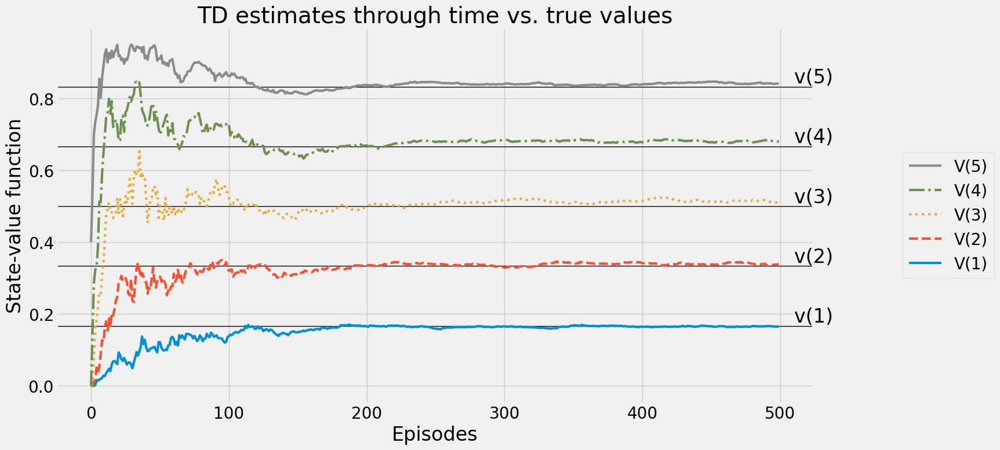

In [28]:
plot_value_function('TD estimates through time vs. true values', V_track_td, V_true, log=False)

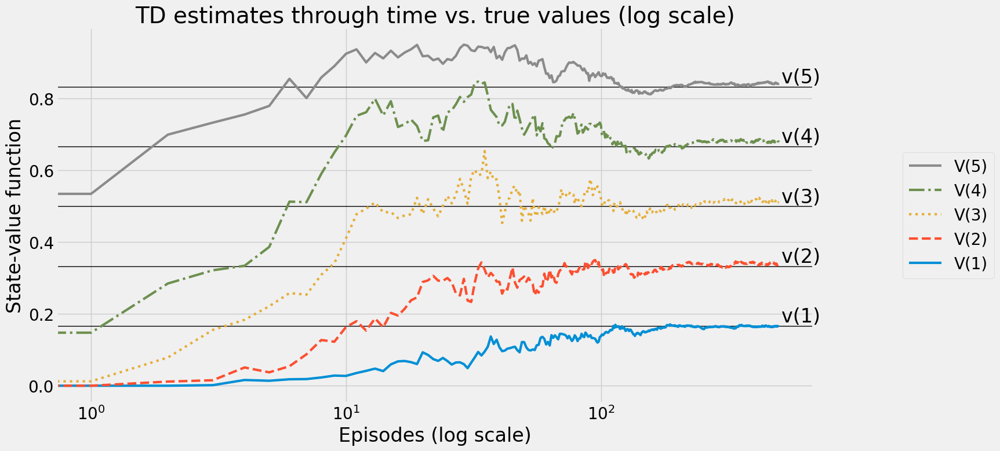

In [29]:
plot_value_function('TD estimates through time vs. true values (log scale)', V_track_td, V_true, log=True)

TD definitely converges faster than both MC methods, as it updates estimates incrementally after each step, allowing for quicker propagation of value information through the state space.
Moreover the variance in TD estimates is generally lower than that of MC methods, as TD updates are based on bootstrapped estimates rather than full returns, which can be noisy.

# Comparing MC and TD

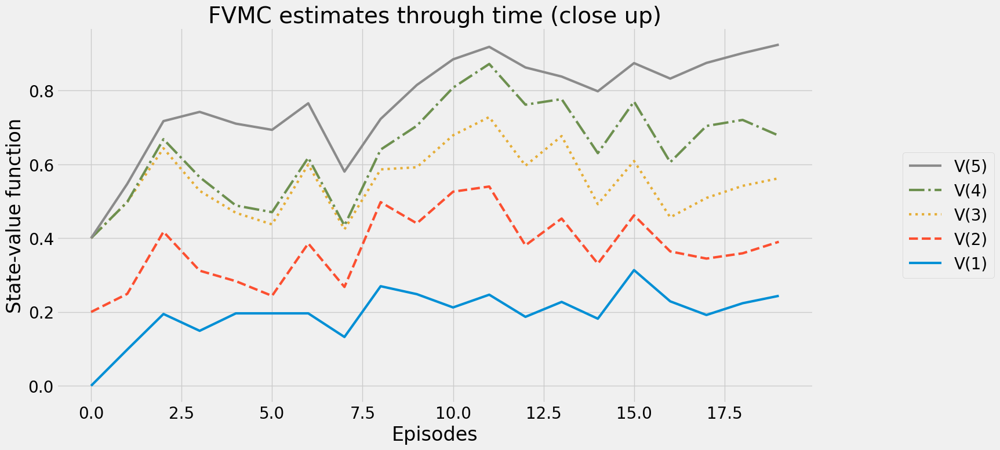

In [30]:
plot_value_function('FVMC estimates through time (close up)', V_track_fvmc[:20], None, log=False)

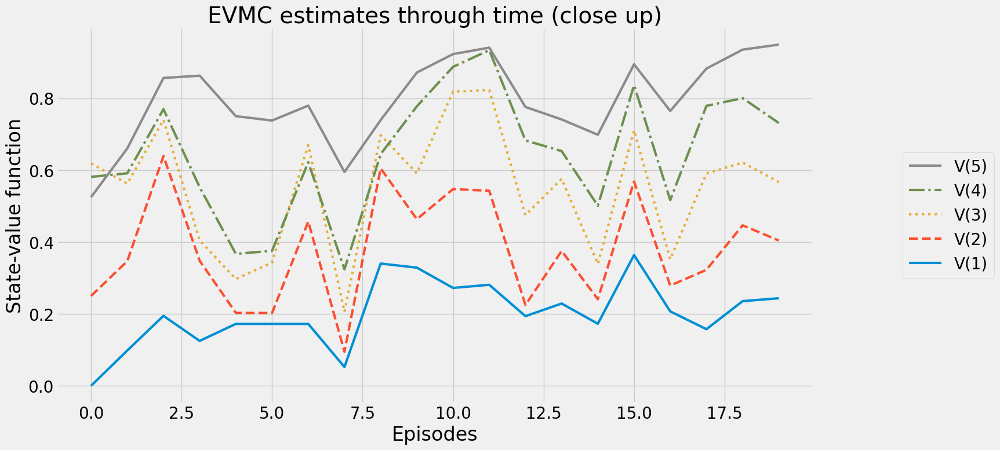

In [31]:
plot_value_function('EVMC estimates through time (close up)', V_track_evmc[:20], None, log=False)

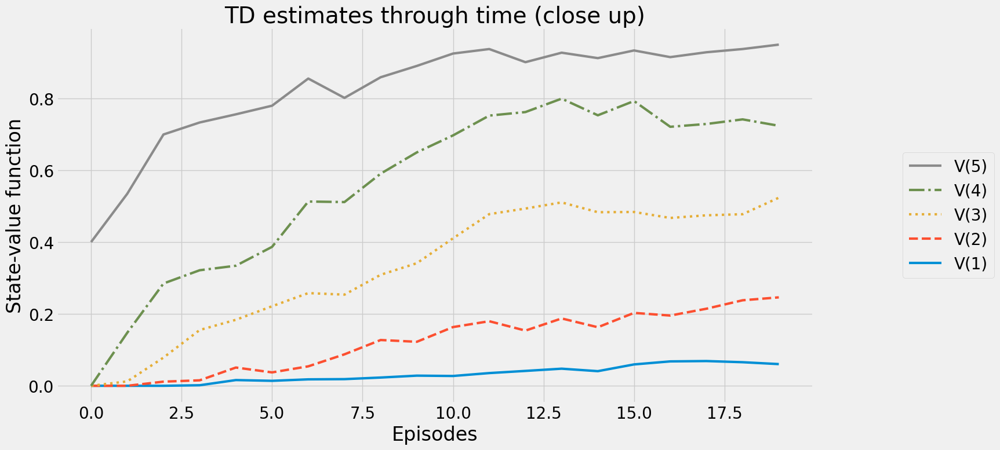

In [32]:
plot_value_function('TD estimates through time (close up)', V_track_td[:20], None, log=False)

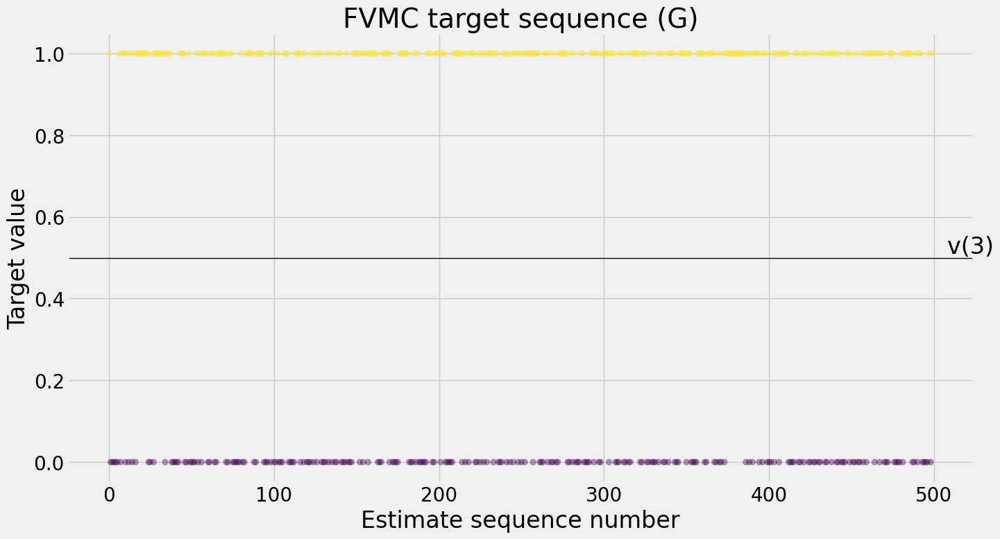

In [37]:
plot_targets(targets_fvmc, init_state, title='FVMC target sequence (G)')

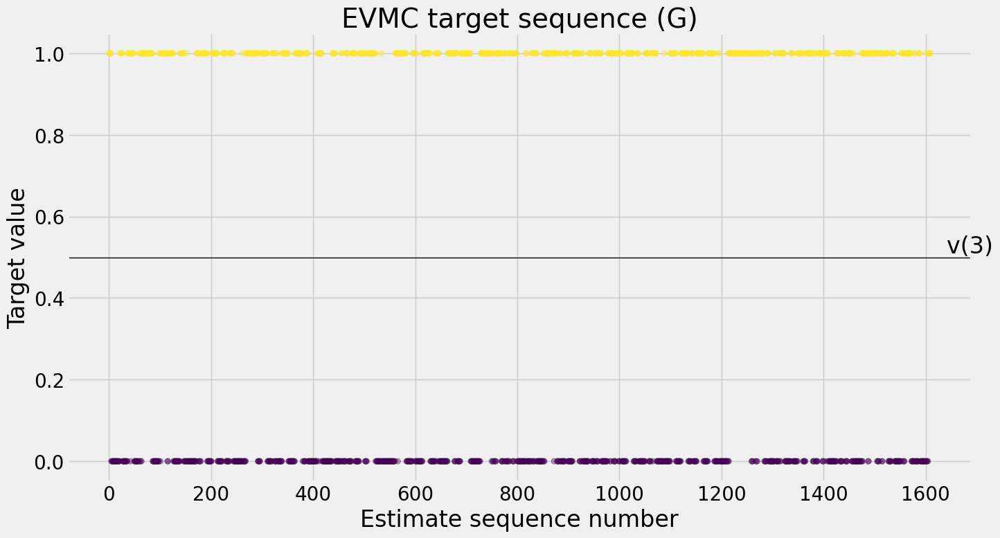

In [38]:
plot_targets(targets_evmc, init_state, title='EVMC target sequence (G)')

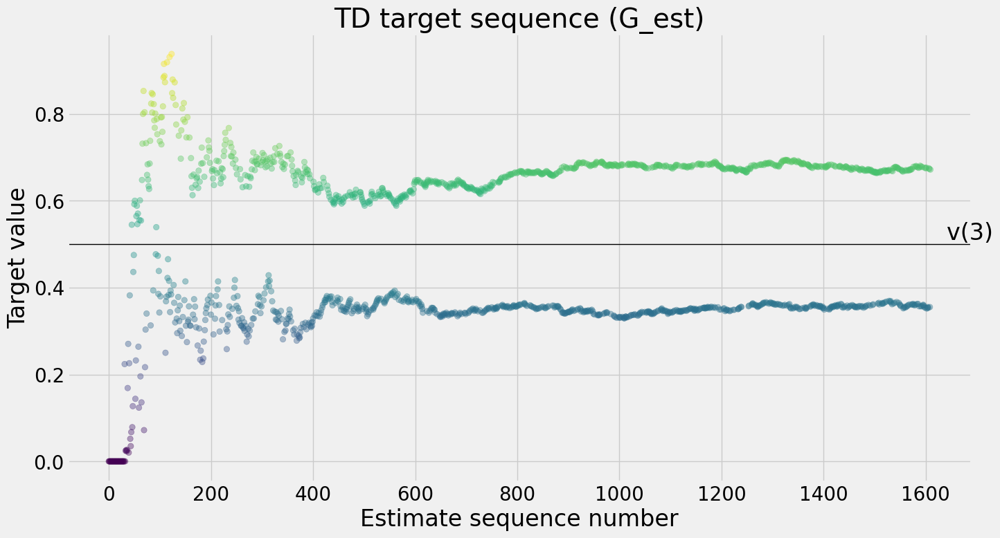

In [40]:
plot_targets(targets_td, init_state, title='TD target sequence (G_est)')

You can see that in TD, the targets change as the initial state "3" was visited multiple times and the value estimates were updated, reflecting the bootstrapped nature of TD learning.
In contrast, both MC methods have fixed targets (the actual returns G) for each state visit, since they rely on complete episodes to compute returns. 

# n-step TD

In [50]:
def ntd(pi : callable, 
        env : gym.Env, 
        gamma : float =1.0,
        init_alpha: float =0.5,
        min_alpha: float =0.01,
        alpha_decay_ratio: float =0.5,
        n_step: int =3,
        n_episodes: int =500):
    nS = env.observation_space.n
    V = np.zeros(nS, dtype=np.float64)
    V_track = np.zeros((n_episodes, nS), dtype=np.float64)
    # precompute discounts
    discounts = np.logspace(0, n_step+1, num=n_step+1, base=gamma, endpoint=False)
    # precompute decaying alphas
    alphas = decay_schedule(
        init_alpha, min_alpha, 
        alpha_decay_ratio, n_episodes)
    
    # We step through episodes
    for e in tqdm(range(n_episodes), leave=False):
        # The `path` variable will hold up to n_step experiences
        state, _ = env.reset()
        done, path = False, []
        while not done or path is not None:
            path = path[1:]
            
            # This is the "Sampling" step
            # we continue until either we have n_step experiences or episode ends
            # the algorith requres max n_step experiences to compute the n-step TD target
            while not done and len(path) < n_step:
                action = pi(state)
                next_state, reward, terminated, truncated, _ = env.step(action)
                done = terminated or truncated
                experience = (state, reward, next_state, done)
                path.append(experience)
                state = next_state
                if done:
                    break

            # Now we have either n_step experiences or episode ended, experience loaded in `path`
            # We can compute the n-step TD target and update V
            n = len(path)
            est_state = path[0][0]
            
            # get G[t to t_n] then discount them
            rewards = np.array(path)[:,1]
            partial_return = discounts[:n] * rewards
            
            # Compute the bootstrapped value at time t+n
            # This is the last term in the n-step TD target
            bs_val = discounts[-1] * V[next_state] * (not done)
            
            # Then we get the estimated G which is a combination of actual rewards up until t+n-1 and the bootstrapped value at t+n
            ntd_target = np.sum(np.append(partial_return, bs_val))

            # Now we can compute the error and update V
            ntd_error = ntd_target - V[est_state]
            
            # Update V[est_state] as in typical supervised learning
            V[est_state] = V[est_state] + alphas[e] * ntd_error
            
            # If we only have one experience left and it's terminal, we are done
            if len(path) == 1 and path[0][3]:
                path = None

        V_track[e] = V
    return V, V_track

In [51]:
V_ntds, V_track_ntds = [], []
for seed in tqdm(SEEDS, desc='All seeds', leave=True):
    random.seed(seed); np.random.seed(seed) ; env.reset(seed=seed)
    V_ntd, V_track_ntd = ntd(pi, env, gamma=gamma, n_episodes=n_episodes)
    V_ntds.append(V_ntd) ; V_track_ntds.append(V_track_ntd)
V_ntd, V_track_ntd = np.mean(V_ntds, axis=0), np.mean(V_track_ntds, axis=0)
del V_ntds ; del V_track_ntds

All seeds:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

In [52]:
print_state_value_function(V_ntd, P, n_cols=7)
print()
print_state_value_function(V_ntd - V_true, P, n_cols=7, title='State-value function errors:')
print('RMSE:', rmse(V_ntd, V_true))

State-value function:
| 00    0.0 | 01   0.17 | 02  0.343 | 03  0.511 | 04  0.681 | 05  0.849 | 06    0.0 |

State-value function errors:
| 00 -0.083 | 01  0.004 | 02   0.01 | 03  0.011 | 04  0.014 | 05  0.015 | 06 -0.417 |
RMSE: 0.1609


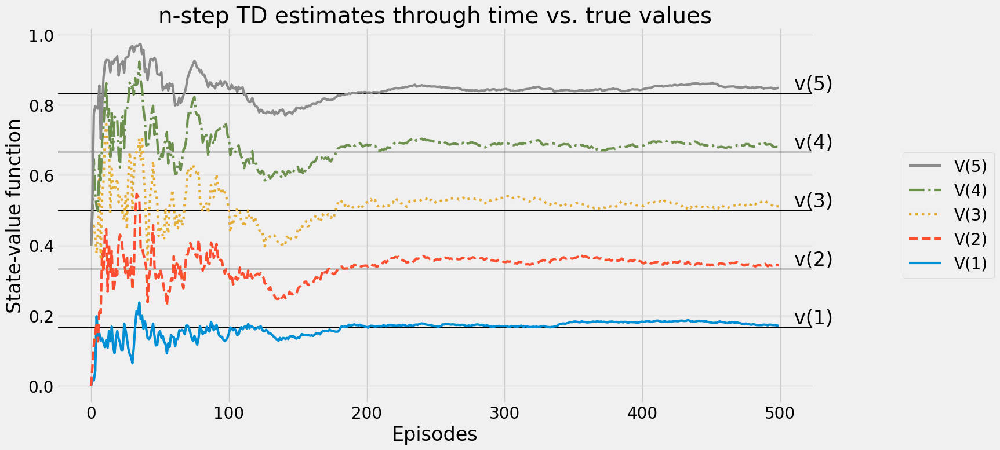

In [53]:
plot_value_function('n-step TD estimates through time vs. true values', V_track_ntd, V_true, log=False)

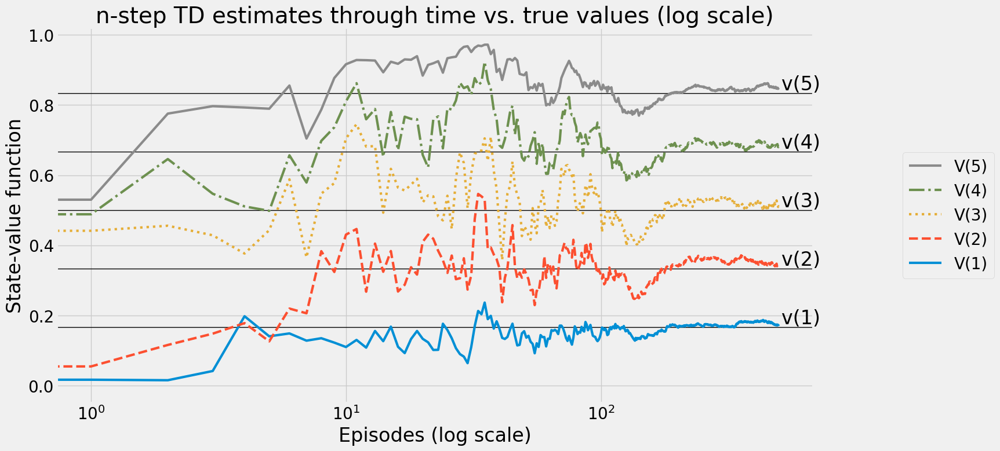

In [54]:
plot_value_function('n-step TD estimates through time vs. true values (log scale)', V_track_ntd, V_true, log=True)

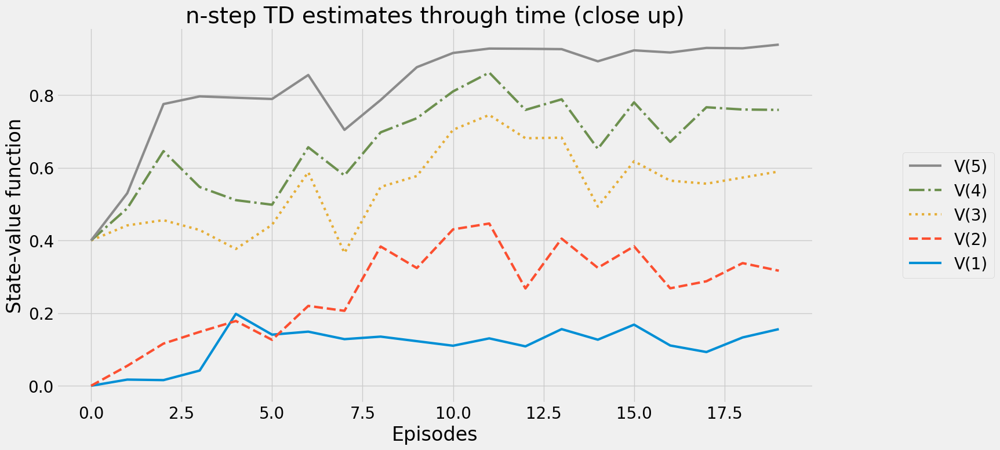

In [55]:
plot_value_function('n-step TD estimates through time (close up)', V_track_ntd[:20], None, log=False)

# TD(λ)

In [57]:
def td_lambda(pi : callable, 
              env : gym.Env, 
              gamma: float =1.0,
              init_alpha: float =0.5,
              min_alpha: float =0.01,
              alpha_decay_ratio: float =0.5,
              lambda_: float =0.3,
              n_episodes: int =500):
    nS = env.observation_space.n
    V = np.zeros(nS, dtype=np.float64)
    E = np.zeros(nS, dtype=np.float64)
    V_track = np.zeros((n_episodes, nS), dtype=np.float64)
    # precompute decaying alphas
    alphas = decay_schedule(
        init_alpha, min_alpha, 
        alpha_decay_ratio, n_episodes)
    for e in tqdm(range(n_episodes), leave=False):
        E.fill(0)
        state, _ = env.reset()
        done = False
        while not done:
            action = pi(state)
            next_state, reward, terminated, truncated, _ = env.step(action)
            done = terminated or truncated
            td_target = reward + gamma * V[next_state] * (not done)
            td_error = td_target - V[state]
            
            # when you encounter a state, you 
            # add a one to its trace.
            E[state] = E[state] + 1
            # Then only states with non-zero traces are updated
            V = V + alphas[e] * td_error * E
            # We then decay the traces by lambda, effectively reducing their influence over time
            E = gamma * lambda_ * E
            state = next_state
        V_track[e] = V
    return V, V_track

In [58]:
V_tdls, V_track_tdls = [], []
for seed in tqdm(SEEDS, desc='All seeds', leave=True):
    random.seed(seed); np.random.seed(seed) ; env.reset(seed=seed)
    V_tdl, V_track_tdl = td_lambda(pi, env, gamma=gamma, n_episodes=n_episodes)
    V_tdls.append(V_tdl) ; V_track_tdls.append(V_track_tdl)
V_tdl, V_track_tdl = np.mean(V_tdls, axis=0), np.mean(V_track_tdls, axis=0)
del V_tdls ; del V_track_tdls

All seeds:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

In [59]:
print_state_value_function(V_tdl, P, n_cols=7)
print()
print_state_value_function(V_tdl - V_true, P, n_cols=7, title='State-value function errors:')
print('RMSE:', rmse(V_tdl, V_true))

State-value function:
| 00    0.0 | 01  0.165 | 02  0.342 | 03  0.511 | 04  0.678 | 05  0.844 | 06    0.0 |

State-value function errors:
| 00 -0.083 | 01 -0.001 | 02  0.008 | 03  0.011 | 04  0.012 | 05   0.01 | 06 -0.417 |
RMSE: 0.1608


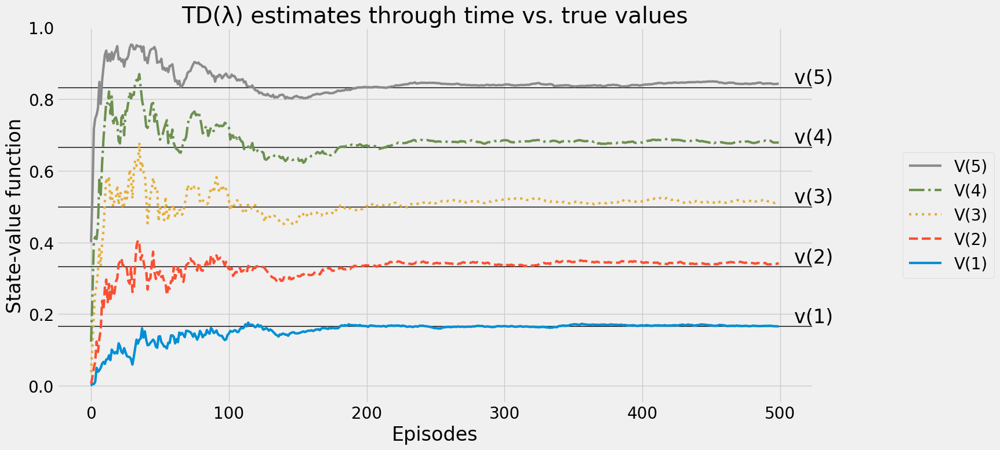

In [60]:
plot_value_function('TD(λ) estimates through time vs. true values', V_track_tdl, V_true, log=False)

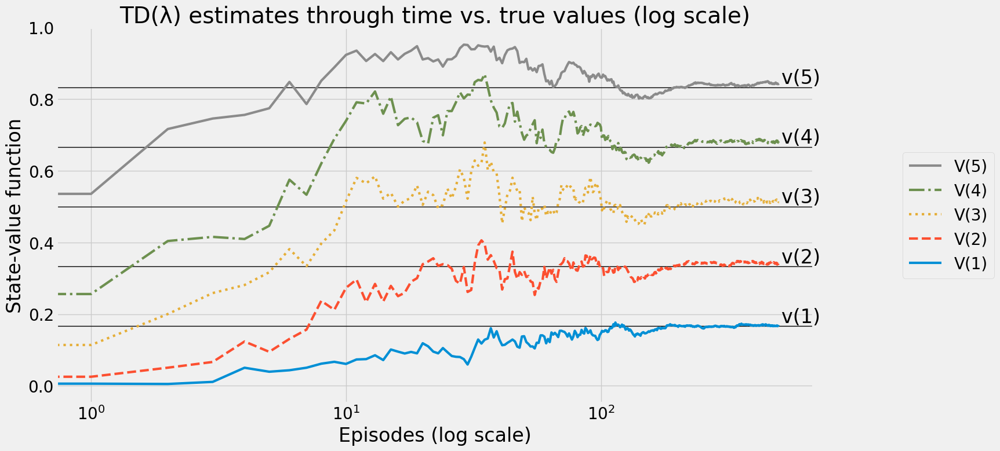

In [61]:
plot_value_function('TD(λ) estimates through time vs. true values (log scale)', V_track_tdl, V_true, log=True)

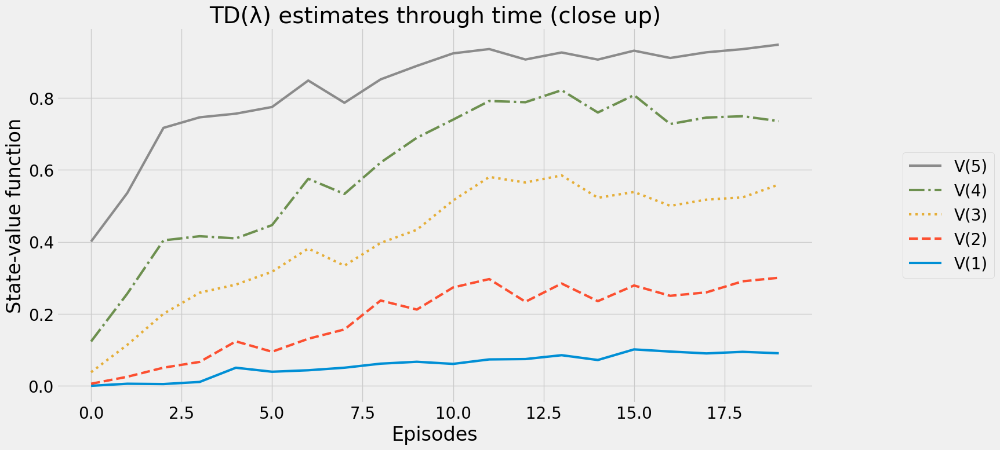

In [62]:
plot_value_function('TD(λ) estimates through time (close up)', V_track_tdl[:20], None, log=False)

# Russell & Norvig Gridworld environment and sample policy

In [63]:
env = gym.make('RussellNorvigGridworld-v0')
init_state, _ = env.reset()
goal_state = 3
gamma = 1.0
n_episodes = 1000
P = env.unwrapped.P

LEFT, DOWN, RIGHT, UP = range(4)
pi = lambda s: {
    0:RIGHT, 1:RIGHT, 2:RIGHT, 3:LEFT,
    4:UP,    5:LEFT,  6:UP,    7:LEFT,
    8:UP,    9:LEFT, 10:LEFT, 11:LEFT
}[s]
V_true = policy_evaluation(pi, P, gamma=gamma)

print_state_value_function(V_true, P)
print()

print_policy(pi, P)
print('Reaches goal {:.2f}%. Obtains an average return of {:.4f}.'.format(
    probability_success(env, pi, goal_state=goal_state), 
    mean_return(env, gamma, pi)))

State-value function:
| 00  0.812 | 01  0.868 | 02  0.918 |           |
| 04  0.762 |           | 06   0.66 |           |
| 08  0.705 | 09  0.655 | 10  0.611 | 11  0.388 |

Policy:
| 00      > | 01      > | 02      > |           |
| 04      ^ |           | 06      ^ |           |
| 08      ^ | 09      < | 10      < | 11      < |
Reaches goal 96.00%. Obtains an average return of 0.6544.


# Russell & Norvig Gridworld policy estimation (policy to state-value function)

In [64]:
V_fvmcs, V_track_fvmcs = [], []
for seed in tqdm(SEEDS, desc='All seeds', leave=True):
    random.seed(seed); np.random.seed(seed) ; env.reset(seed=seed)
    V_fvmc, V_track_fvmc, targets_fvmc = mc_prediction(pi, env, gamma=gamma, n_episodes=n_episodes)
    V_fvmcs.append(V_fvmc) ; V_track_fvmcs.append(V_track_fvmc)
V_fvmc, V_track_fvmc = np.mean(V_fvmcs, axis=0), np.mean(V_track_fvmcs, axis=0)
del V_fvmcs ; del V_track_fvmcs

All seeds:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

In [65]:
print_state_value_function(V_fvmc, P)
print()
print_state_value_function(V_fvmc - V_true, P, title='State-value function errors:')
print('RMSE:', rmse(V_fvmc, V_true))

State-value function:
| 00  0.816 | 01  0.872 | 02  0.923 |           |
| 04  0.767 |           | 06  0.724 |           |
| 08  0.712 | 09  0.662 | 10    0.0 | 11    0.0 |

State-value function errors:
| 00  0.005 | 01  0.004 | 02  0.005 |           |
| 04  0.005 |           | 06  0.063 |           |
| 08  0.007 | 09  0.007 | 10 -0.611 | 11 -0.388 |
RMSE: 0.2099


In [66]:
V_evmcs, V_track_evmcs = [], []
for seed in tqdm(SEEDS, desc='All seeds', leave=True):
    random.seed(seed); np.random.seed(seed) ; env.reset(seed=seed)
    V_evmc, V_track_evmc, targets_evmc = mc_prediction(pi, env, gamma=gamma, n_episodes=n_episodes, first_visit=False)
    V_evmcs.append(V_evmc) ; V_track_evmcs.append(V_track_evmc)
V_evmc, V_track_evmc = np.mean(V_evmcs, axis=0), np.mean(V_track_evmcs, axis=0)
del V_evmcs ; del V_track_evmcs

All seeds:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

In [67]:
print_state_value_function(V_evmc, P)
print()
print_state_value_function(V_evmc - V_true, P, title='State-value function errors:')
print('RMSE:', rmse(V_evmc, V_true))

State-value function:
| 00  0.819 | 01  0.864 | 02  0.921 |           |
| 04  0.772 |           | 06  0.724 |           |
| 08  0.716 | 09  0.667 | 10    0.0 | 11    0.0 |

State-value function errors:
| 00  0.007 | 01 -0.004 | 02  0.003 |           |
| 04  0.011 |           | 06  0.064 |           |
| 08   0.01 | 09  0.012 | 10 -0.611 | 11 -0.388 |
RMSE: 0.2099


In [68]:
V_tds, V_track_tds = [], []
for seed in tqdm(SEEDS, desc='All seeds', leave=True):
    random.seed(seed); np.random.seed(seed) ; env.reset(seed=seed)
    V_td, V_track_td, targets_td = td(pi, env, gamma=gamma, n_episodes=n_episodes)
    V_tds.append(V_td) ; V_track_tds.append(V_track_td)
V_td, V_track_td = np.mean(V_tds, axis=0), np.mean(V_track_tds, axis=0)
del V_tds ; del V_track_tds

All seeds:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

In [69]:
print_state_value_function(V_td, P)
print()
print_state_value_function(V_td - V_true, P, title='State-value function errors:')
print('RMSE:', rmse(V_td, V_true))

State-value function:
| 00   0.81 | 01  0.867 | 02  0.921 |           |
| 04  0.761 |           | 06  0.697 |           |
| 08  0.704 | 09  0.638 | 10    0.0 | 11    0.0 |

State-value function errors:
| 00 -0.002 | 01 -0.001 | 02  0.003 |           |
| 04 -0.001 |           | 06  0.037 |           |
| 08 -0.001 | 09 -0.017 | 10 -0.611 | 11 -0.388 |
RMSE: 0.2094


In [70]:
V_ntds, V_track_ntds = [], []
for seed in tqdm(SEEDS, desc='All seeds', leave=True):
    random.seed(seed); np.random.seed(seed) ; env.reset(seed=seed)
    V_ntd, V_track_ntd = ntd(pi, env, gamma=gamma, n_episodes=n_episodes)
    V_ntds.append(V_ntd) ; V_track_ntds.append(V_track_ntd)
V_ntd, V_track_ntd = np.mean(V_ntds, axis=0), np.mean(V_track_ntds, axis=0)
del V_ntds ; del V_track_ntds

All seeds:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

In [71]:
print_state_value_function(V_ntd, P)
print()
print_state_value_function(V_ntd - V_true, P, title='State-value function errors:')
print('RMSE:', rmse(V_ntd, V_true))

State-value function:
| 00  0.818 | 01  0.874 | 02  0.923 |           |
| 04  0.769 |           | 06  0.727 |           |
| 08  0.715 | 09   0.66 | 10    0.0 | 11    0.0 |

State-value function errors:
| 00  0.006 | 01  0.006 | 02  0.005 |           |
| 04  0.007 |           | 06  0.067 |           |
| 08   0.01 | 09  0.004 | 10 -0.611 | 11 -0.388 |
RMSE: 0.21


In [72]:
V_tdls, V_track_tdls = [], []
for seed in tqdm(SEEDS, desc='All seeds', leave=True):
    random.seed(seed); np.random.seed(seed) ; env.reset(seed=seed)
    V_tdl, V_track_tdl = td_lambda(pi, env, gamma=gamma, n_episodes=n_episodes)
    V_tdls.append(V_tdl) ; V_track_tdls.append(V_track_tdl)
V_tdl, V_track_tdl = np.mean(V_tdls, axis=0), np.mean(V_track_tdls, axis=0)
del V_tdls ; del V_track_tdls

All seeds:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

In [73]:
print_state_value_function(V_tdl, P)
print()
print_state_value_function(V_tdl - V_true, P, title='State-value function errors:')
print('RMSE:', rmse(V_tdl, V_true))

State-value function:
| 00  0.814 | 01   0.87 | 02  0.923 |           |
| 04  0.765 |           | 06  0.709 |           |
| 08  0.709 | 09  0.649 | 10    0.0 | 11    0.0 |

State-value function errors:
| 00  0.003 | 01  0.003 | 02  0.005 |           |
| 04  0.003 |           | 06  0.049 |           |
| 08  0.003 | 09 -0.006 | 10 -0.611 | 11 -0.388 |
RMSE: 0.2095


# Russell & Norvig Gridworld state-value function estimation

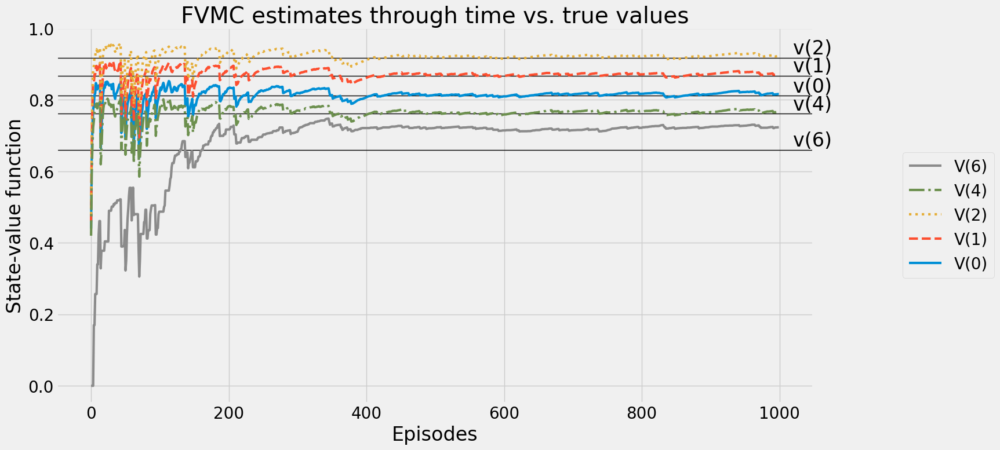

In [74]:
plot_value_function('FVMC estimates through time vs. true values', V_track_fvmc, V_true, log=False)

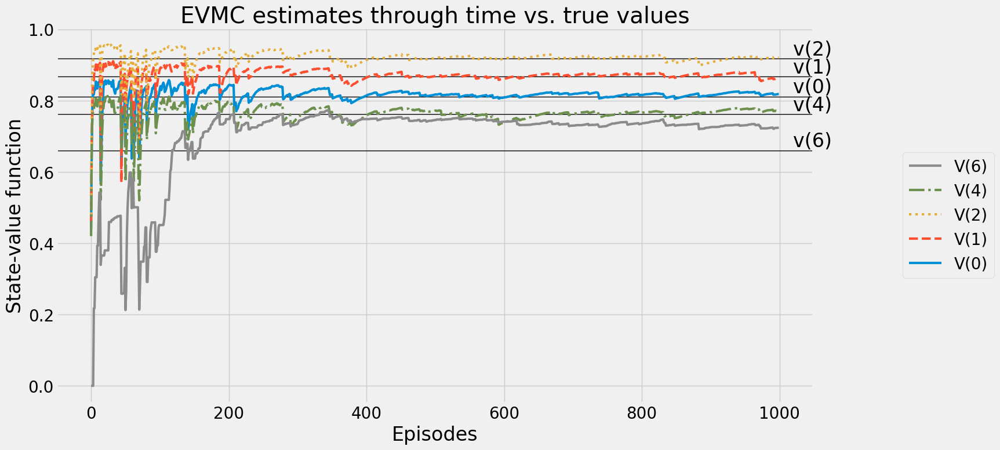

In [75]:
plot_value_function('EVMC estimates through time vs. true values', V_track_evmc, V_true, log=False)

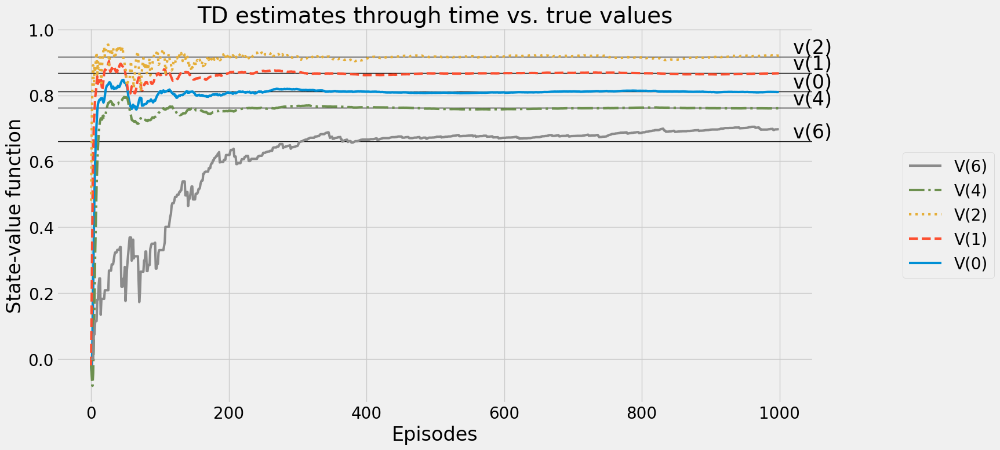

In [76]:
plot_value_function('TD estimates through time vs. true values', V_track_td, V_true, log=False)

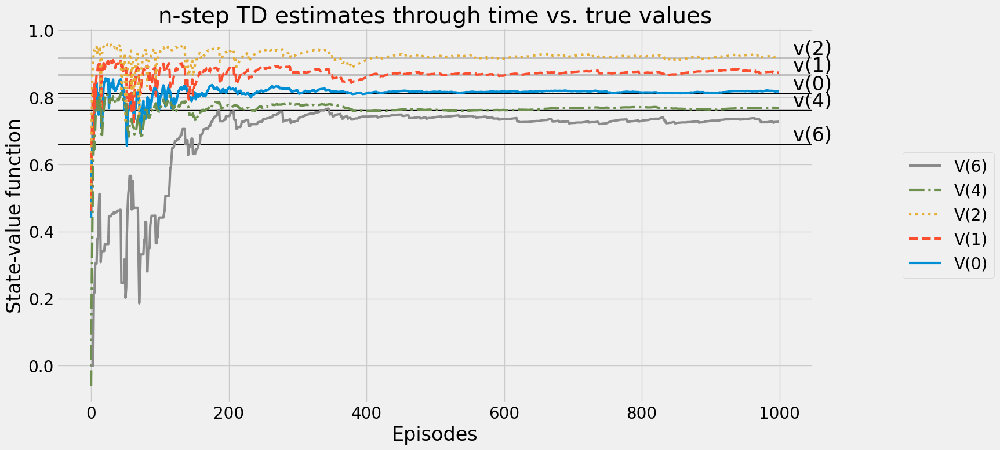

In [77]:
plot_value_function('n-step TD estimates through time vs. true values', V_track_ntd, V_true, log=False)

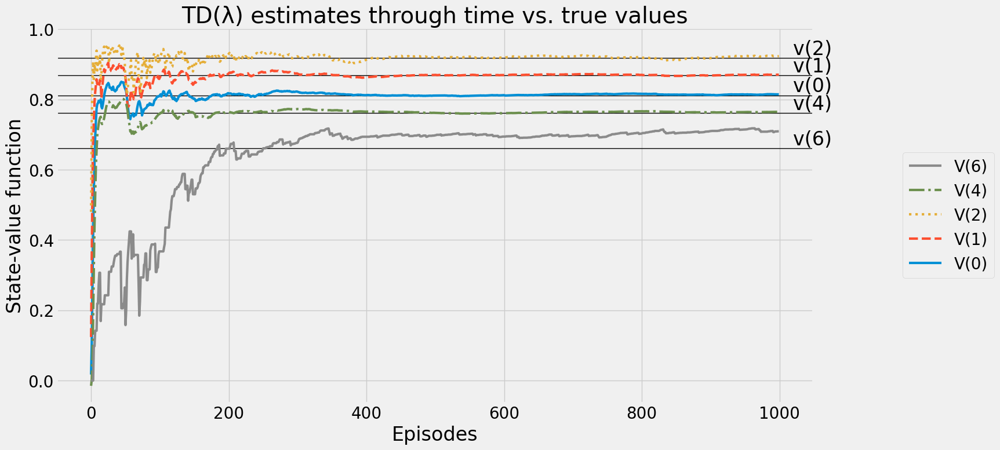

In [78]:
plot_value_function('TD(λ) estimates through time vs. true values', V_track_tdl, V_true, log=False)

# Russell & Norvig Gridworld state-value function estimation (x axis in log scale)

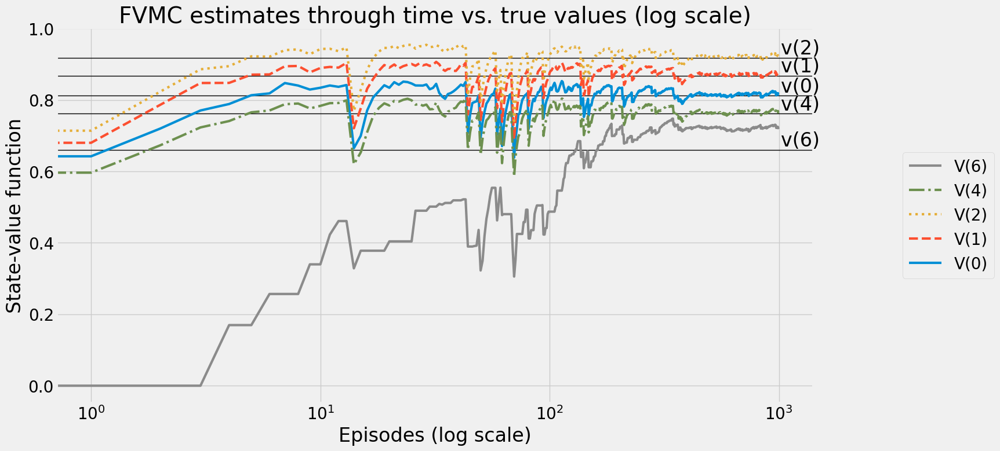

In [79]:
plot_value_function('FVMC estimates through time vs. true values (log scale)', V_track_fvmc, V_true, log=True)

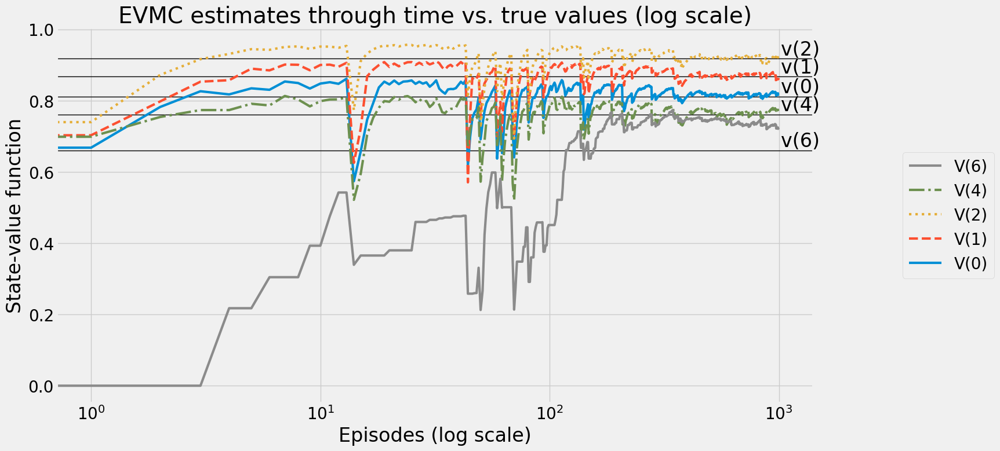

In [80]:
plot_value_function('EVMC estimates through time vs. true values (log scale)', V_track_evmc, V_true, log=True)

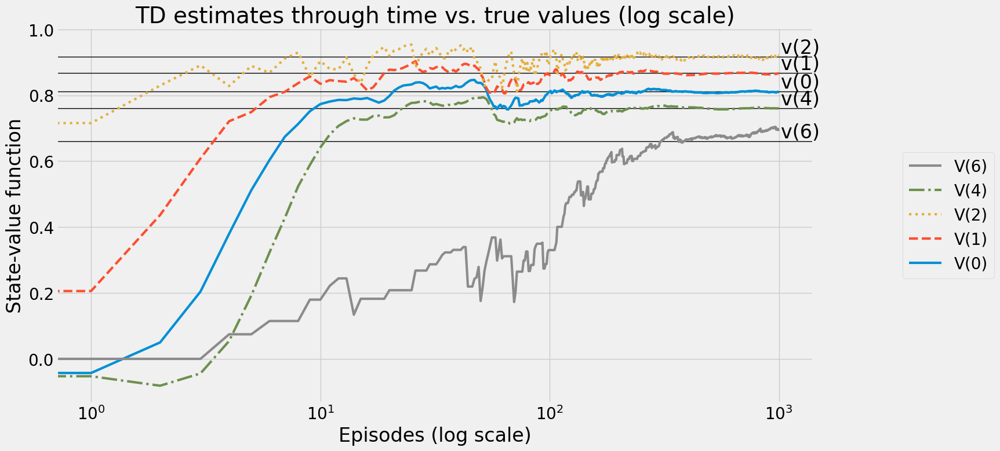

In [81]:
plot_value_function('TD estimates through time vs. true values (log scale)', V_track_td, V_true, log=True)

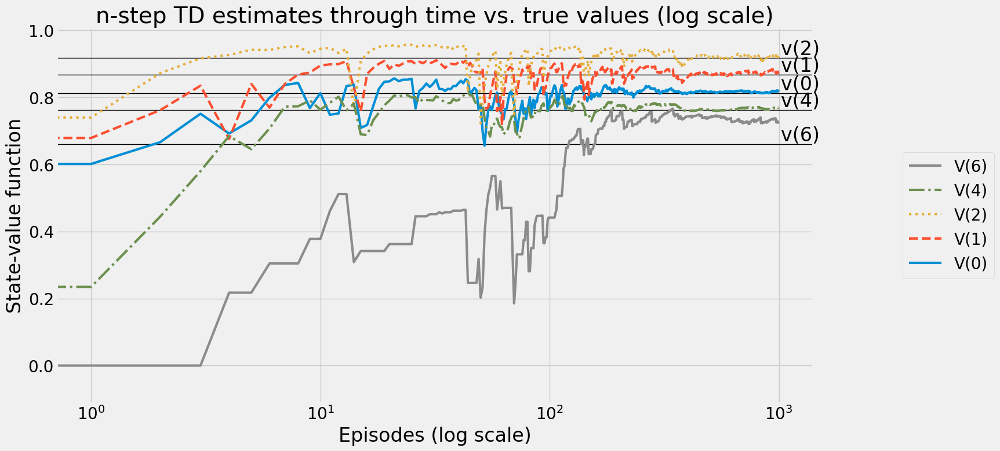

In [82]:
plot_value_function('n-step TD estimates through time vs. true values (log scale)', V_track_ntd, V_true, log=True)

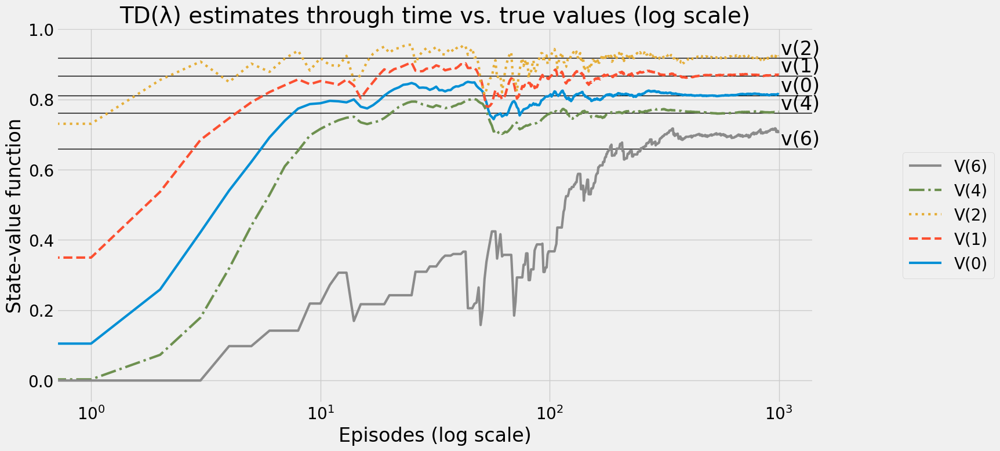

In [83]:
plot_value_function('TD(λ) estimates through time vs. true values (log scale)', V_track_tdl, V_true, log=True)

# Close ups

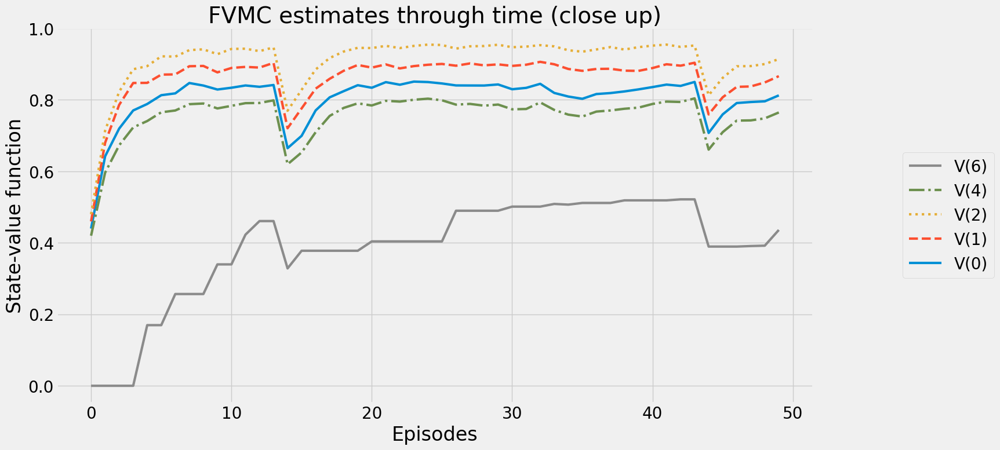

In [84]:
plot_value_function('FVMC estimates through time (close up)', V_track_fvmc[:50], None, log=False)

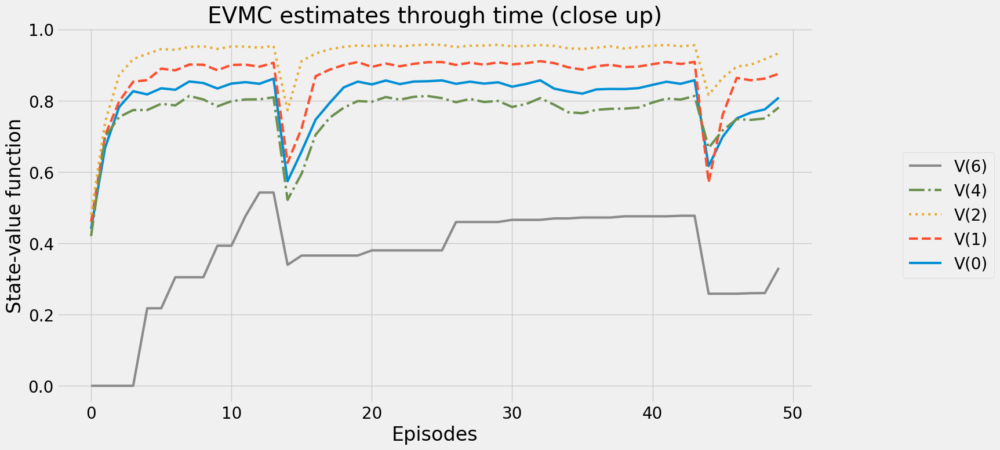

In [85]:
plot_value_function('EVMC estimates through time (close up)', V_track_evmc[:50], None, log=False)

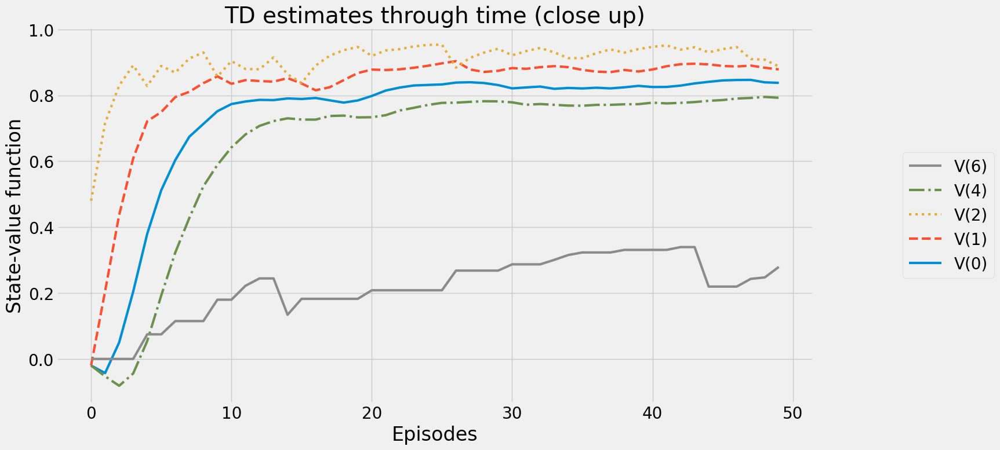

In [86]:
plot_value_function('TD estimates through time (close up)', V_track_td[:50], None, log=False)

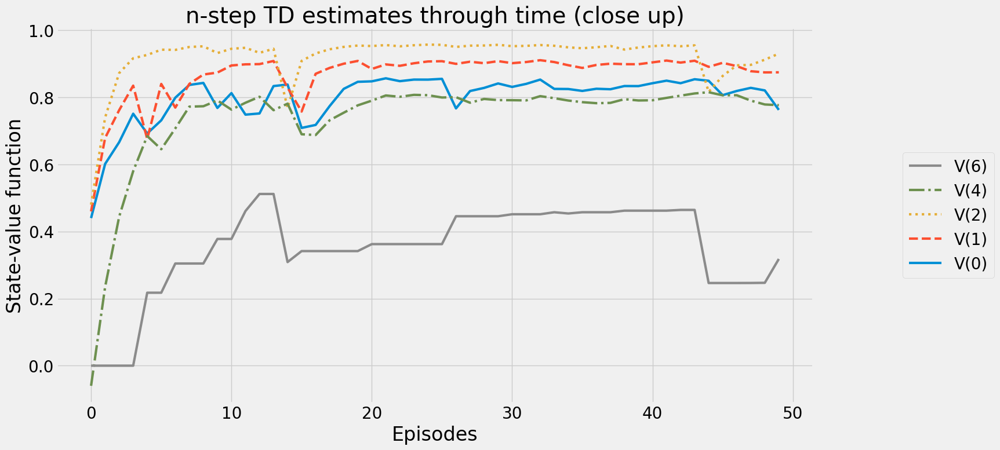

In [87]:
plot_value_function('n-step TD estimates through time (close up)', V_track_ntd[:50], None, log=False)

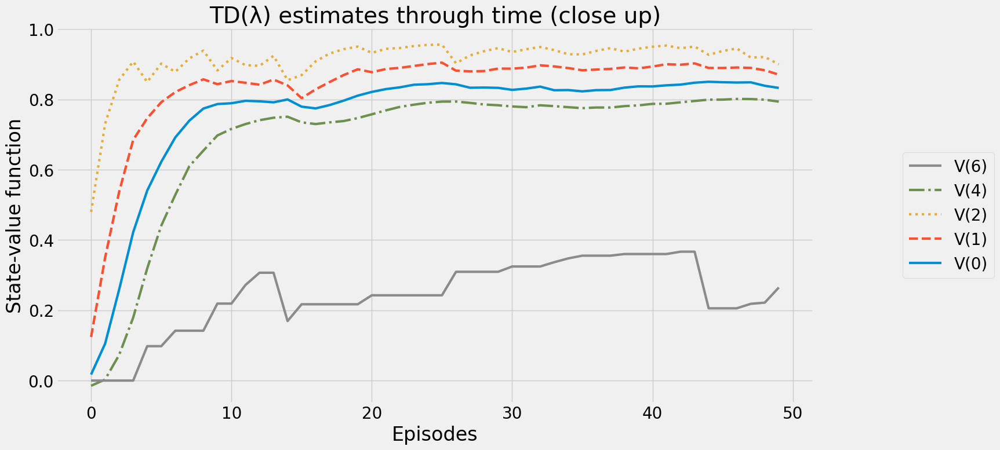

In [88]:
plot_value_function('TD(λ) estimates through time (close up)', V_track_tdl[:50], None, log=False)

# MC vs. TD

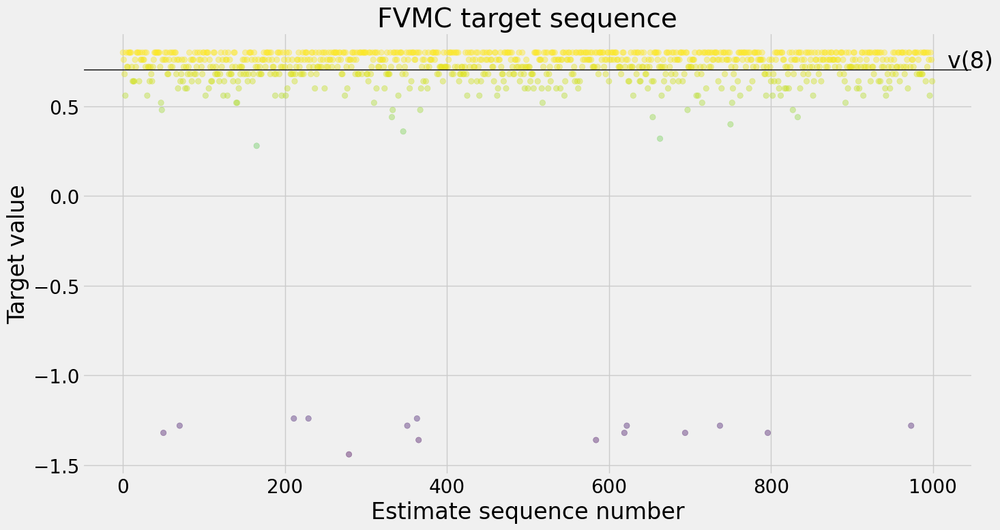

In [89]:
plot_targets(targets_fvmc, init_state, title='FVMC target sequence')

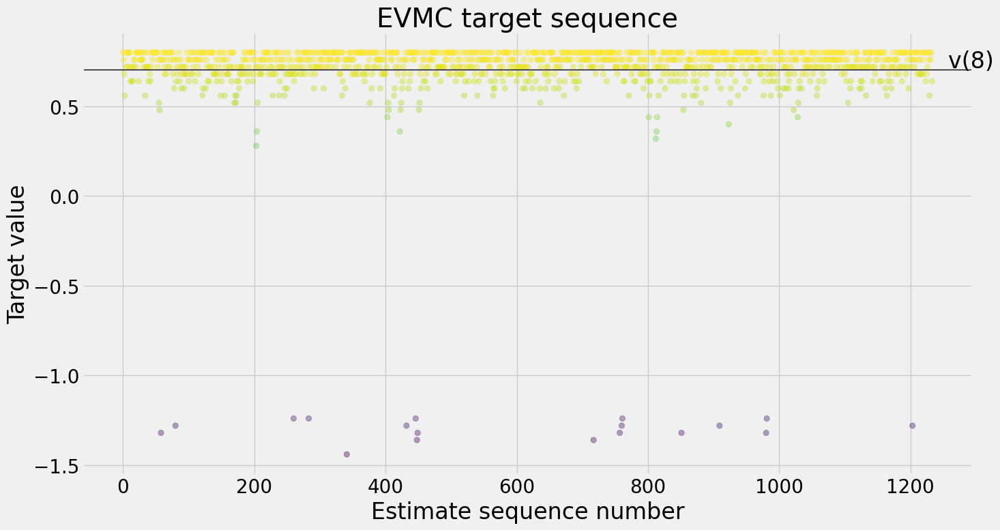

In [90]:
plot_targets(targets_evmc, init_state, title='EVMC target sequence')

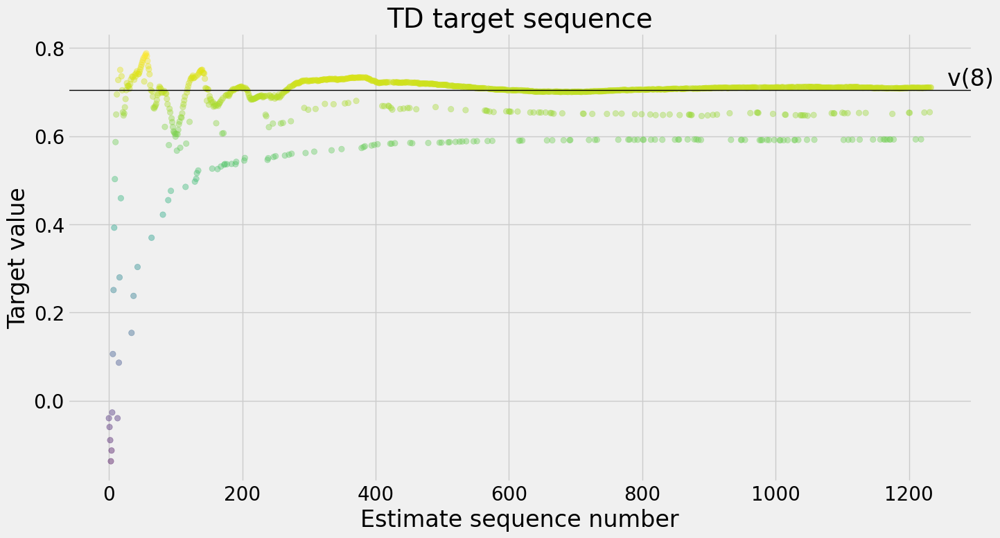

In [91]:
plot_targets(targets_td, init_state, title='TD target sequence')

# FrozenLake environment and sample policy

In [92]:
env = gym.make('FrozenLake-v1')
init_state, _ = env.reset()
goal_state = 15
gamma = 0.99
n_episodes = 2500
P = env.unwrapped.P

LEFT, DOWN, RIGHT, UP = range(4)
pi = lambda s: {
    0:LEFT,   1:UP,     2:UP,    3:UP,
    4:LEFT,   5:LEFT,   6:LEFT,  7:LEFT,
    8:UP,     9:DOWN,  10:LEFT, 11:LEFT,
    12:LEFT, 13:RIGHT, 14:DOWN, 15:LEFT
}[s]
V_true = policy_evaluation(pi, P, gamma=gamma)

print_state_value_function(V_true, P)
print()

print_policy(pi, P)
print('Reaches goal {:.2f}%. Obtains an average return of {:.4f}.'.format(
    probability_success(env, pi, goal_state=goal_state), 
    mean_return(env, gamma, pi)))

State-value function:
| 00  0.542 | 01  0.499 | 02  0.471 | 03  0.457 |
| 04  0.558 |           | 06  0.358 |           |
| 08  0.592 | 09  0.643 | 10  0.615 |           |
|           | 13  0.742 | 14  0.863 |           |

Policy:
| 00      < | 01      ^ | 02      ^ | 03      ^ |
| 04      < |           | 06      < |           |
| 08      ^ | 09      v | 10      < |           |
|           | 13      > | 14      v |           |
Reaches goal 69.00%. Obtains an average return of 0.4809.


# FrozenLake policy estimation (policy to state-value function)

In [93]:
V_fvmcs, V_track_fvmcs = [], []
for seed in tqdm(SEEDS, desc='All seeds', leave=True):
    random.seed(seed); np.random.seed(seed) ; env.reset(seed=seed)
    V_fvmc, V_track_fvmc, targets_fvmc = mc_prediction(pi, env, gamma=gamma, n_episodes=n_episodes)
    V_fvmcs.append(V_fvmc) ; V_track_fvmcs.append(V_track_fvmc)
V_fvmc, V_track_fvmc = np.mean(V_fvmcs, axis=0), np.mean(V_track_fvmcs, axis=0)
del V_fvmcs ; del V_track_fvmcs

All seeds:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

In [94]:
print_state_value_function(V_fvmc, P)
print()
print_state_value_function(V_fvmc - V_true, P, title='State-value function errors:')
print('RMSE:', rmse(V_fvmc, V_true))

State-value function:
| 00  0.517 | 01  0.357 | 02  0.335 | 03  0.307 |
| 04  0.533 |           | 06   0.31 |           |
| 08  0.567 | 09  0.611 | 10  0.575 |           |
|           | 13  0.695 | 14  0.834 |           |

State-value function errors:
| 00 -0.025 | 01 -0.141 | 02 -0.136 | 03  -0.15 |
| 04 -0.026 |           | 06 -0.049 |           |
| 08 -0.025 | 09 -0.032 | 10  -0.04 |           |
|           | 13 -0.046 | 14 -0.029 |           |
RMSE: 0.0666


In [95]:
V_evmcs, V_track_evmcs = [], []
for seed in tqdm(SEEDS, desc='All seeds', leave=True):
    random.seed(seed); np.random.seed(seed) ; env.reset(seed=seed)
    V_evmc, V_track_evmc, targets_evmc = mc_prediction(pi, env, gamma=gamma, n_episodes=n_episodes, first_visit=False)
    V_evmcs.append(V_evmc) ; V_track_evmcs.append(V_track_evmc)
V_evmc, V_track_evmc = np.mean(V_evmcs, axis=0), np.mean(V_track_evmcs, axis=0)
del V_evmcs ; del V_track_evmcs

All seeds:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

In [96]:
print_state_value_function(V_evmc, P)
print()
print_state_value_function(V_evmc - V_true, P, title='State-value function errors:')
print('RMSE:', rmse(V_evmc, V_true))

State-value function:
| 00  0.484 | 01  0.302 | 02  0.291 | 03  0.282 |
| 04  0.488 |           | 06    0.3 |           |
| 08  0.508 | 09  0.566 | 10  0.548 |           |
|           | 13  0.674 | 14  0.813 |           |

State-value function errors:
| 00 -0.058 | 01 -0.197 | 02  -0.18 | 03 -0.175 |
| 04  -0.07 |           | 06 -0.059 |           |
| 08 -0.084 | 09 -0.077 | 10 -0.067 |           |
|           | 13 -0.067 | 14 -0.049 |           |
RMSE: 0.0928


In [97]:
V_tds, V_track_tds = [], []
for seed in tqdm(SEEDS, desc='All seeds', leave=True):
    random.seed(seed); np.random.seed(seed) ; env.reset(seed=seed)
    V_td, V_track_td, targets_td = td(pi, env, gamma=gamma, n_episodes=n_episodes)
    V_tds.append(V_td) ; V_track_tds.append(V_track_td)
V_td, V_track_td = np.mean(V_tds, axis=0), np.mean(V_track_tds, axis=0)
del V_tds ; del V_track_tds

All seeds:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

In [98]:
print_state_value_function(V_td, P)
print()
print_state_value_function(V_td - V_true, P, title='State-value function errors:')
print('RMSE:', rmse(V_td, V_true))

State-value function:
| 00  0.502 | 01  0.457 | 02  0.422 | 03  0.405 |
| 04  0.522 |           | 06   0.34 |           |
| 08  0.561 | 09  0.617 | 10  0.599 |           |
|           | 13  0.712 | 14  0.841 |           |

State-value function errors:
| 00  -0.04 | 01 -0.041 | 02 -0.048 | 03 -0.051 |
| 04 -0.037 |           | 06 -0.018 |           |
| 08 -0.031 | 09 -0.026 | 10 -0.016 |           |
|           | 13  -0.03 | 14 -0.022 |           |
RMSE: 0.0288


In [99]:
V_ntds, V_track_ntds = [], []
for seed in tqdm(SEEDS, desc='All seeds', leave=True):
    random.seed(seed); np.random.seed(seed) ; env.reset(seed=seed)
    V_ntd, V_track_ntd = ntd(pi, env, gamma=gamma, n_episodes=n_episodes)
    V_ntds.append(V_ntd) ; V_track_ntds.append(V_track_ntd)
V_ntd, V_track_ntd = np.mean(V_ntds, axis=0), np.mean(V_track_ntds, axis=0)
del V_ntds ; del V_track_ntds

All seeds:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

In [100]:
print_state_value_function(V_ntd, P)
print()
print_state_value_function(V_ntd - V_true, P, title='State-value function errors:')
print('RMSE:', rmse(V_ntd, V_true))

State-value function:
| 00  0.498 | 01  0.454 | 02  0.418 | 03  0.399 |
| 04  0.519 |           | 06  0.336 |           |
| 08  0.556 | 09  0.612 | 10  0.593 |           |
|           | 13   0.71 | 14  0.835 |           |

State-value function errors:
| 00 -0.044 | 01 -0.045 | 02 -0.053 | 03 -0.057 |
| 04 -0.039 |           | 06 -0.023 |           |
| 08 -0.036 | 09 -0.031 | 10 -0.022 |           |
|           | 13 -0.032 | 14 -0.028 |           |
RMSE: 0.0323


In [101]:
V_tdls, V_track_tdls = [], []
for seed in tqdm(SEEDS, desc='All seeds', leave=True):
    random.seed(seed); np.random.seed(seed) ; env.reset(seed=seed)
    V_tdl, V_track_tdl = td_lambda(pi, env, gamma=gamma, n_episodes=n_episodes)
    V_tdls.append(V_tdl) ; V_track_tdls.append(V_track_tdl)
V_tdl, V_track_tdl = np.mean(V_tdls, axis=0), np.mean(V_track_tdls, axis=0)
del V_tdls ; del V_track_tdls

All seeds:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

In [102]:
print_state_value_function(V_tdl, P)
print()
print_state_value_function(V_tdl - V_true, P, title='State-value function errors:')
print('RMSE:', rmse(V_tdl, V_true))

State-value function:
| 00  0.501 | 01  0.457 | 02  0.421 | 03  0.404 |
| 04  0.521 |           | 06   0.34 |           |
| 08   0.56 | 09  0.616 | 10  0.599 |           |
|           | 13  0.711 | 14  0.839 |           |

State-value function errors:
| 00 -0.041 | 01 -0.042 | 02 -0.049 | 03 -0.053 |
| 04 -0.037 |           | 06 -0.019 |           |
| 08 -0.032 | 09 -0.027 | 10 -0.016 |           |
|           | 13  -0.03 | 14 -0.024 |           |
RMSE: 0.0294


# FrozenLake state-value function estimation

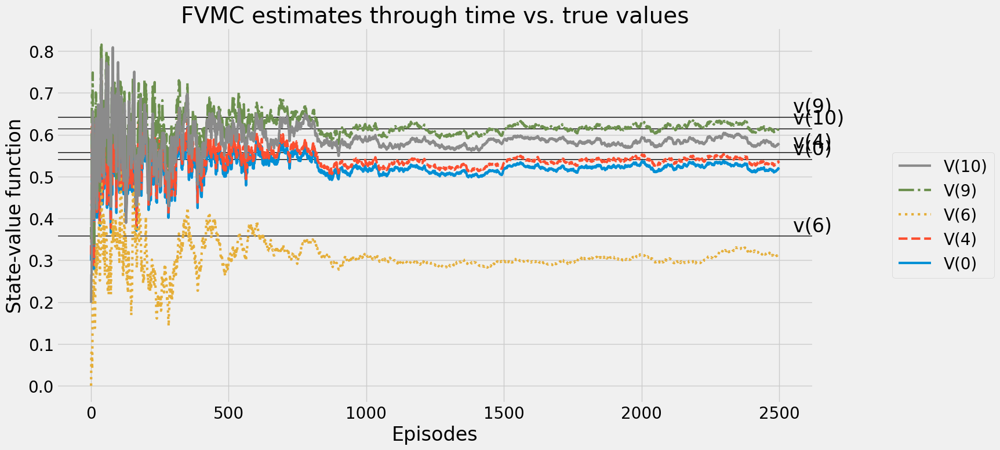

In [103]:
plot_value_function('FVMC estimates through time vs. true values', V_track_fvmc, V_true, log=False)

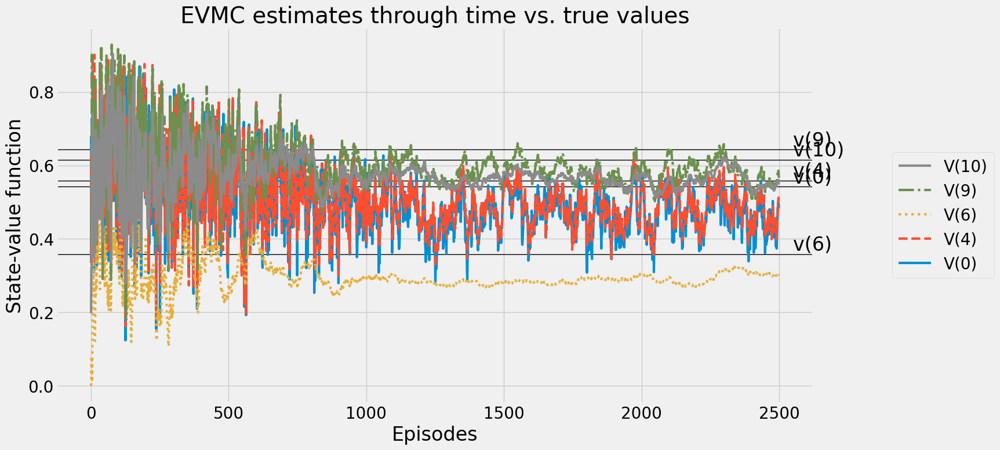

In [104]:
plot_value_function('EVMC estimates through time vs. true values', V_track_evmc, V_true, log=False)

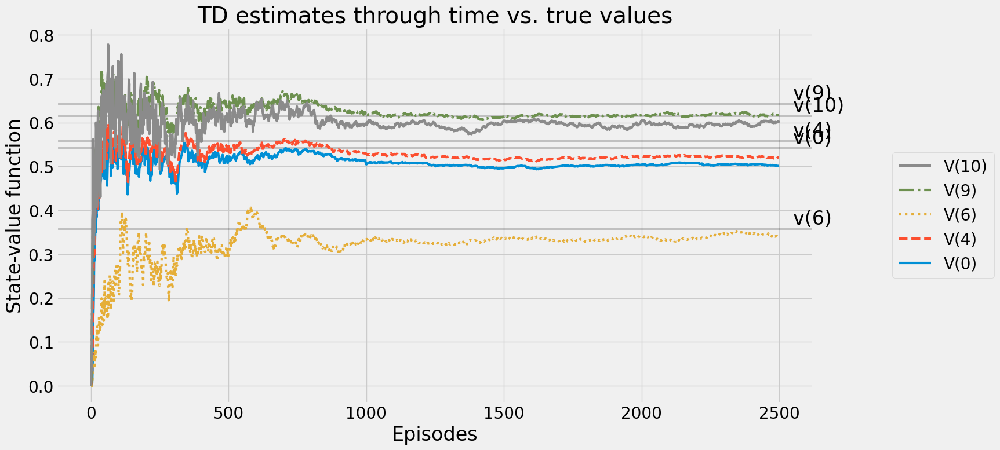

In [105]:
plot_value_function('TD estimates through time vs. true values', V_track_td, V_true, log=False)

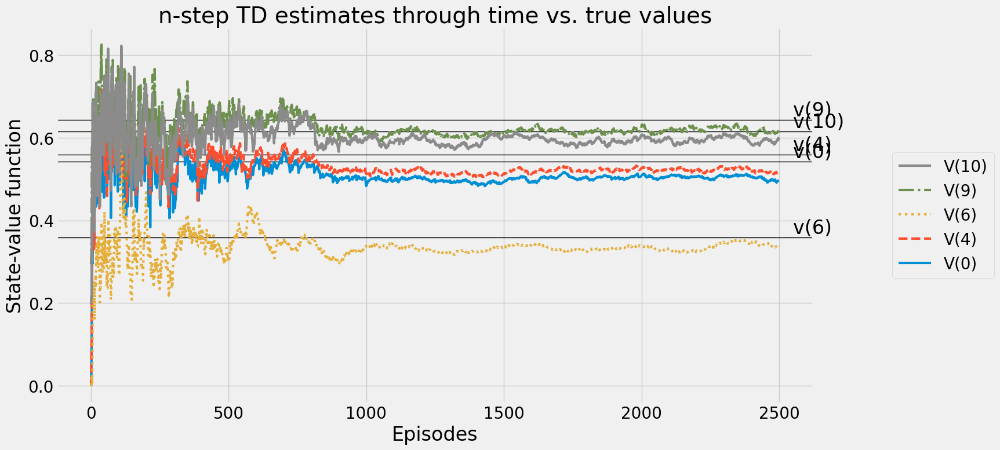

In [106]:
plot_value_function('n-step TD estimates through time vs. true values', V_track_ntd, V_true, log=False)

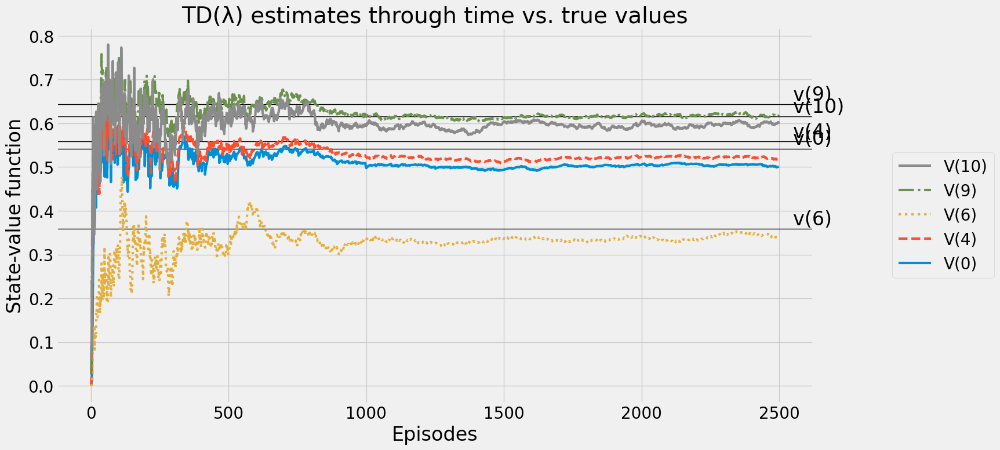

In [107]:
plot_value_function('TD(λ) estimates through time vs. true values', V_track_tdl, V_true, log=False)

# FrozenLake state-value function estimation (x axis in log scale)

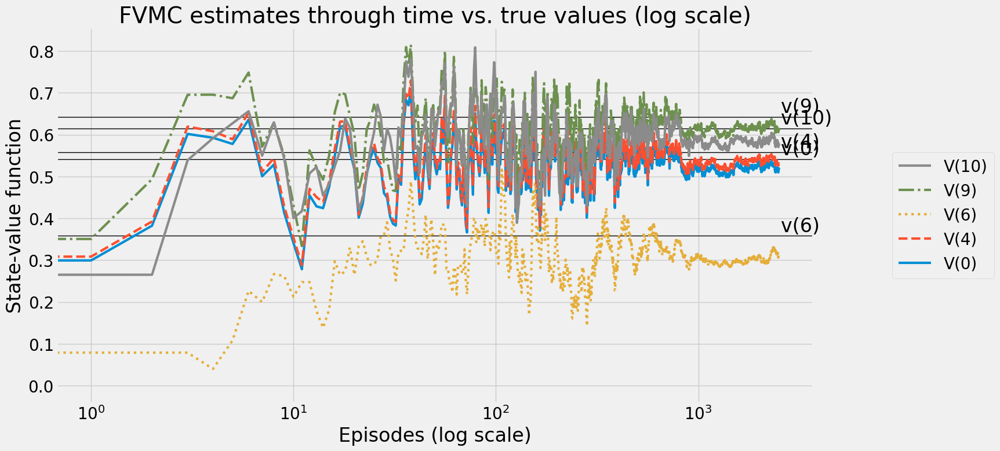

In [108]:
plot_value_function('FVMC estimates through time vs. true values (log scale)', V_track_fvmc, V_true, log=True)

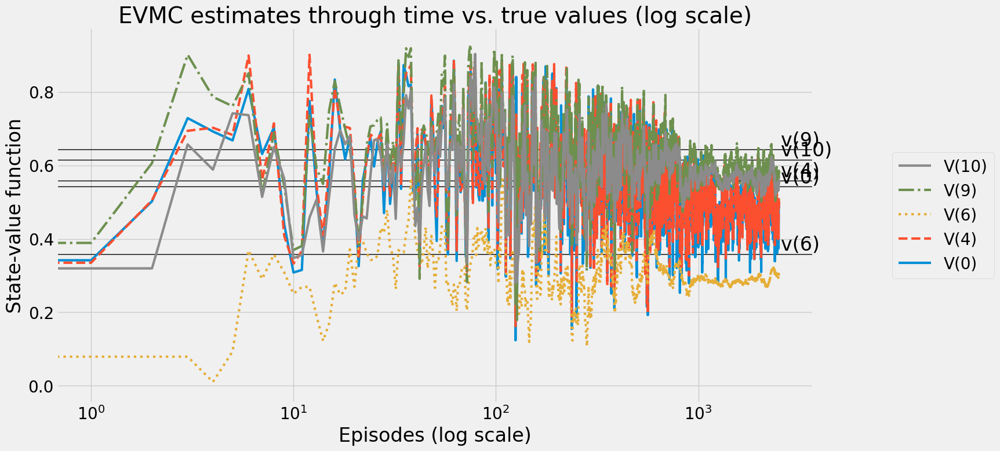

In [109]:
plot_value_function('EVMC estimates through time vs. true values (log scale)', V_track_evmc, V_true, log=True)

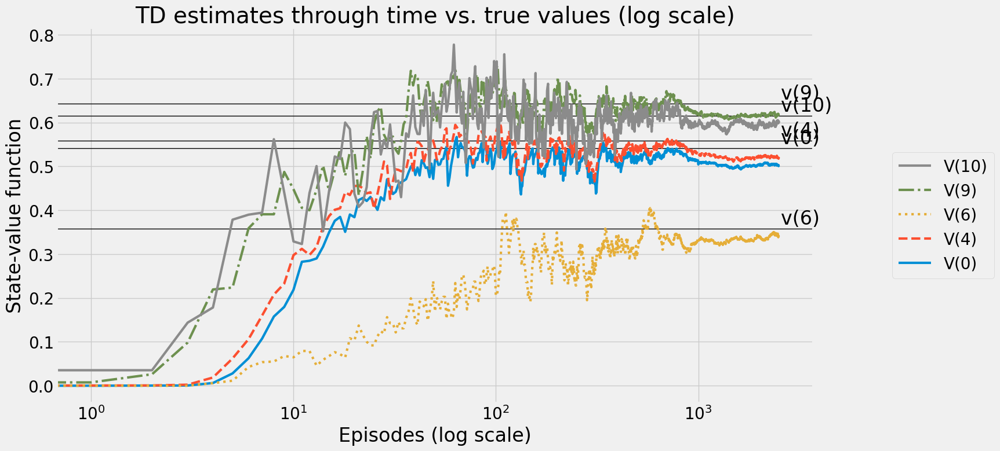

In [110]:
plot_value_function('TD estimates through time vs. true values (log scale)', V_track_td, V_true, log=True)

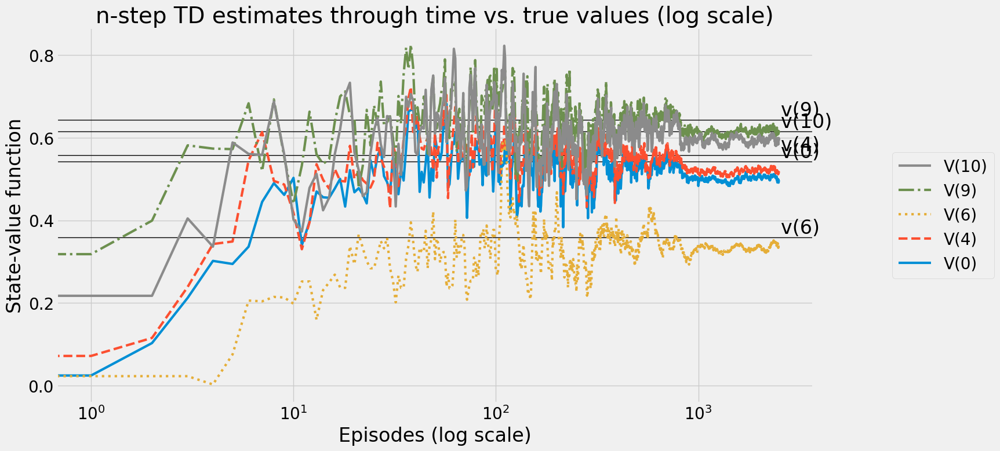

In [111]:
plot_value_function('n-step TD estimates through time vs. true values (log scale)', V_track_ntd, V_true, log=True)

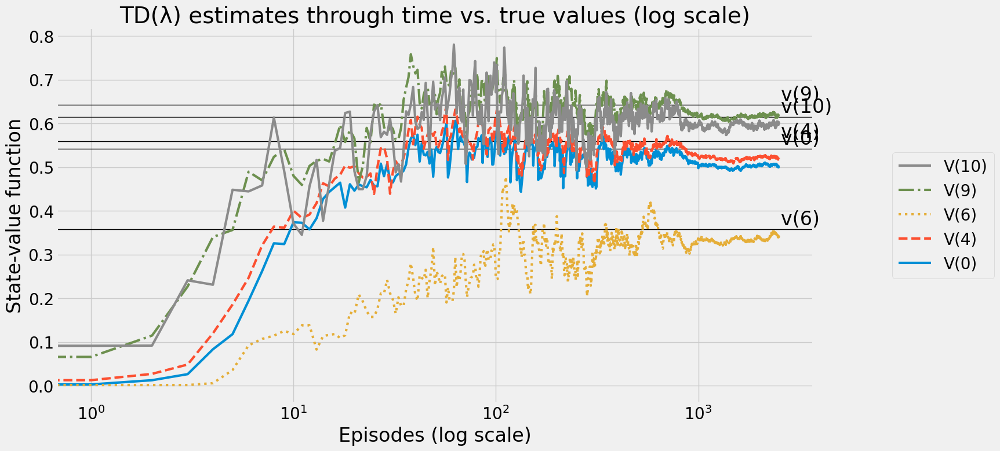

In [112]:
plot_value_function('TD(λ) estimates through time vs. true values (log scale)', V_track_tdl, V_true, log=True)

# Close ups

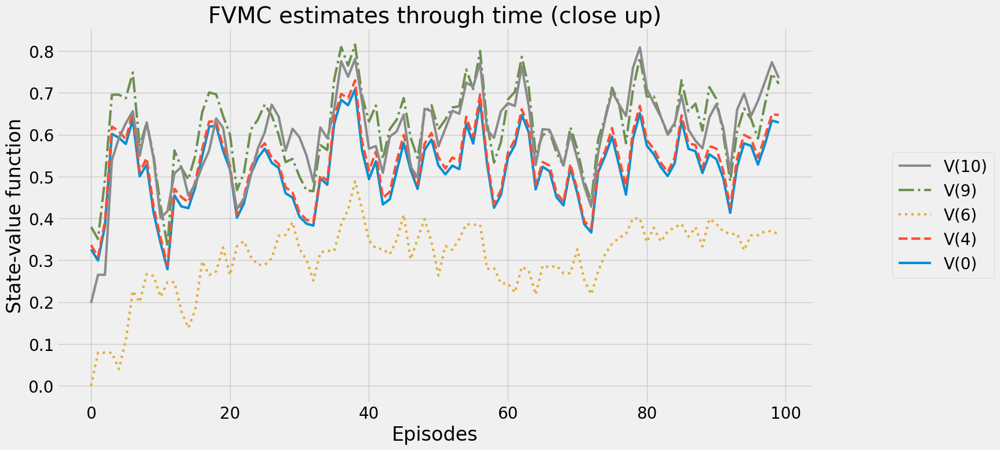

In [113]:
plot_value_function('FVMC estimates through time (close up)', V_track_fvmc[:100], None, log=False)

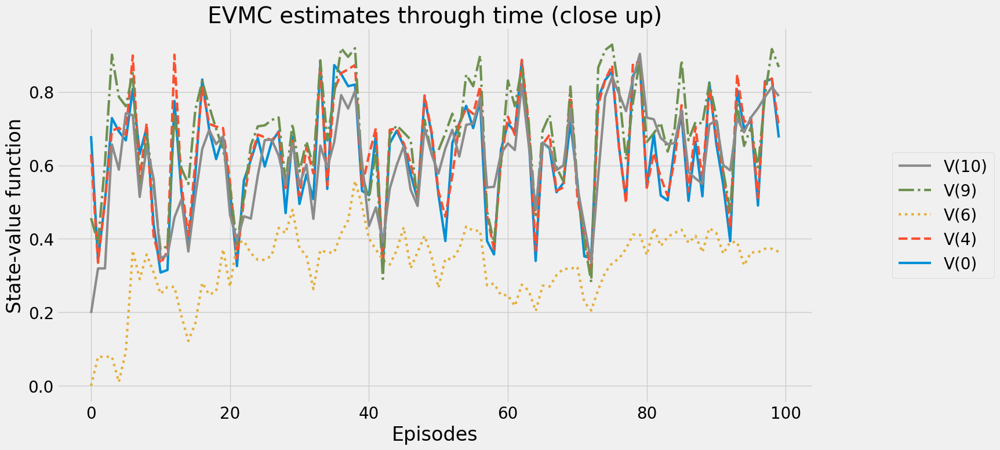

In [114]:
plot_value_function('EVMC estimates through time (close up)', V_track_evmc[:100], None, log=False)

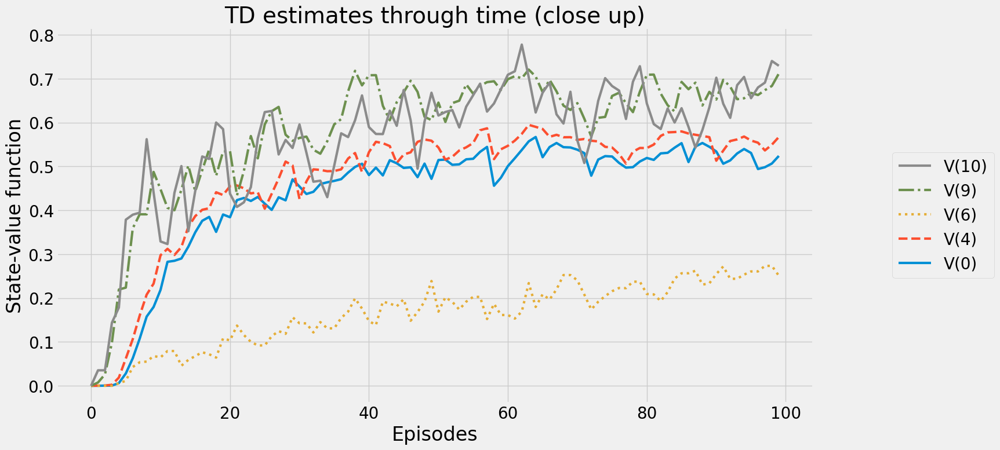

In [115]:
plot_value_function('TD estimates through time (close up)', V_track_td[:100], None, log=False)

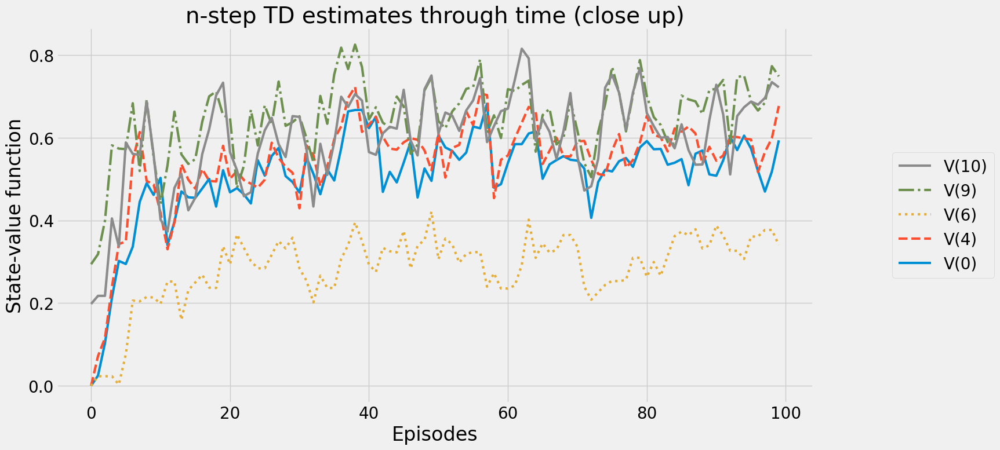

In [116]:
plot_value_function('n-step TD estimates through time (close up)', V_track_ntd[:100], None, log=False)

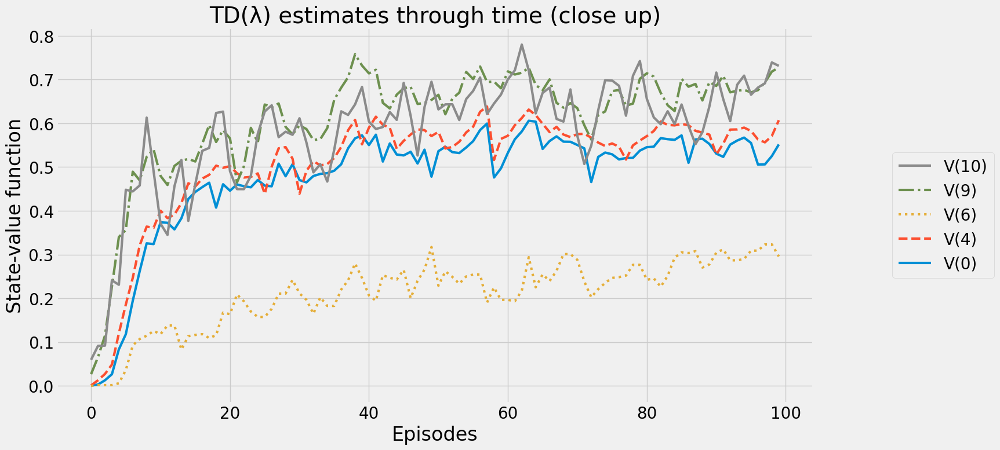

In [117]:
plot_value_function('TD(λ) estimates through time (close up)', V_track_tdl[:100], None, log=False)

# MC vs. TD

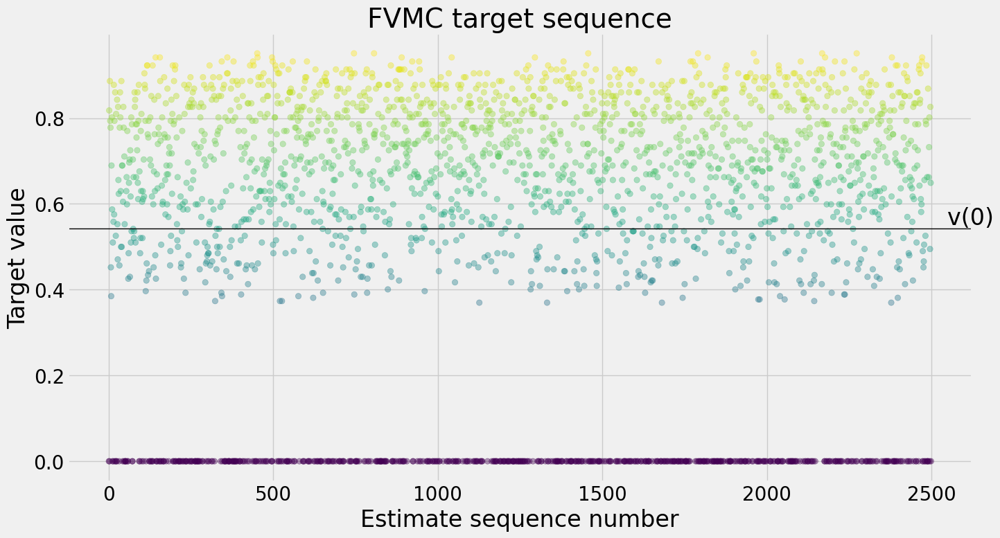

In [118]:
plot_targets(targets_fvmc, init_state, title='FVMC target sequence')

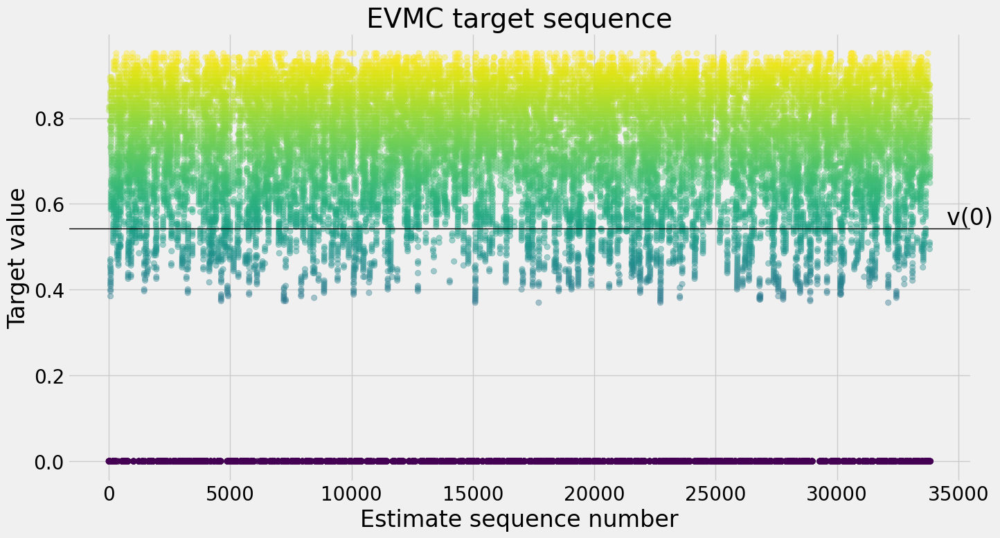

In [119]:
plot_targets(targets_evmc, init_state, title='EVMC target sequence')

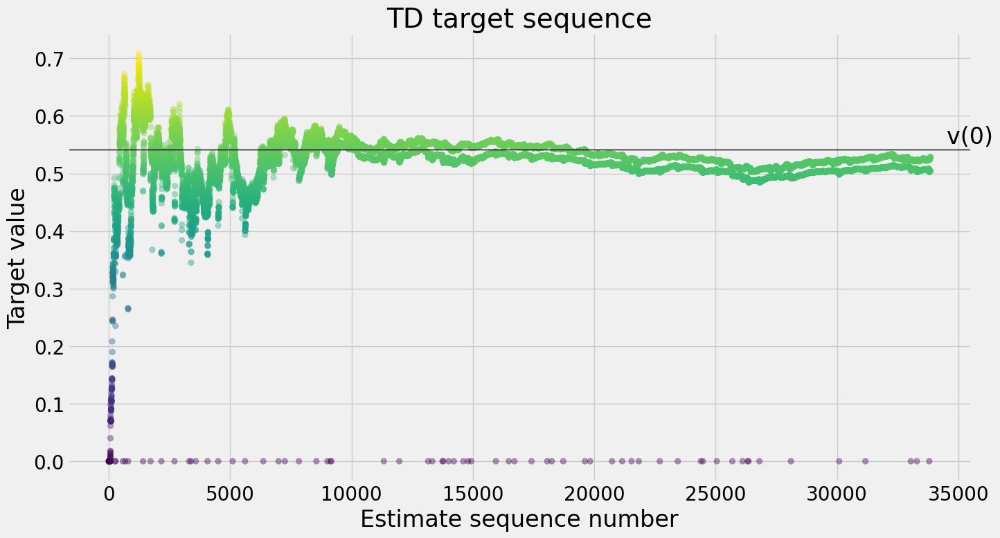

In [120]:
plot_targets(targets_td, init_state, title='TD target sequence')